# Analysis of site/window-based popgen statistics

In [74]:
library(dplyr)
library(data.table)
library(foreach)
library(ggplot2)
library(gridExtra)

plot_theme <- theme_bw() + theme(plot.title = element_text(hjust = 0.5), panel.grid = element_blank())

In [75]:
setwd("~/snap_hap/genome_scans")

## Allele frequency difference

In [76]:
## Read allele frequencies
baseDIR='~/snap_hap/genome_scans'
MAF = foreach (chrom=c(1:8), .combine = rbind) %do% {
    filename=file.path(baseDIR, "alleleFreq", paste0("MY_Chr",chrom,".MAF.csv.gz"))
    tmp = fread(filename, header=TRUE)
    tmp
}

In [77]:
MAF = MAF %>% 
    group_by(scaffold) %>% summarise(chromLength = max(position)) %>% 
    
    # Calculate cumulative position of each chromosome
    mutate(total = cumsum(chromLength)-chromLength) %>% 
    select(-chromLength) %>% 
    
    # Add this info to the initial dataset
    left_join(MAF, ., by=c("scaffold"="scaffold")) %>%
    
    # Add a cumulative position of each SNP
    arrange(scaffold, position) %>%
    mutate(posCum = position + total) %>%
    mutate(dp = abs(YF-MF)) %>%
    mutate(col = ifelse(dp>0.4,'red','grey80'))

In [78]:
str(MAF)

Classes ‘data.table’ and 'data.frame':	19925574 obs. of  8 variables:
 $ scaffold: chr  "Chr1" "Chr1" "Chr1" "Chr1" ...
 $ position: int  3817 3850 3873 3881 3917 3922 3946 3981 3992 3994 ...
 $ MF      : num  0.2667 0.18 0 0.0067 0.4 ...
 $ YF      : num  0.256 0.259 0.012 0 0.416 ...
 $ total   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ posCum  : int  3817 3850 3873 3881 3917 3922 3946 3981 3992 3994 ...
 $ dp      : num  0.0106 0.079 0.012 0.0067 0.0157 ...
 $ col     : chr  "grey80" "grey80" "grey80" "grey80" ...
 - attr(*, ".internal.selfref")=<externalptr> 


In [79]:
## Regions of interest

#CREMOSA Chr1:500000-1500000
MAF_CRE = MAF[scaffold=='Chr1' & position>=500000 & position<=1500000]

#AURINA Chr2:600000-1600000
MAF_AUR = MAF[scaffold=='Chr2' & position>=600000 & position<=1600000]

#FLAVIA Chr2:52000000-54500000
MAF_FLA = MAF[scaffold=='Chr2' & position>=52000000 & position<=54500000]

#SULF Chr4:37500000-39000000
MAF_SULF = MAF[scaffold=='Chr4' & position>=37500000 & position<=39000000]

#RUBIA Chr5:6000000-7000000
MAF_ROSEL = MAF[scaffold=='Chr5' & position>=6000000 & position<=7000000]

#RosEL Chr6:52500000-53500000
MAF_ROSEL = MAF[scaffold=='Chr6' & position>=52500000 & position<=53500000]

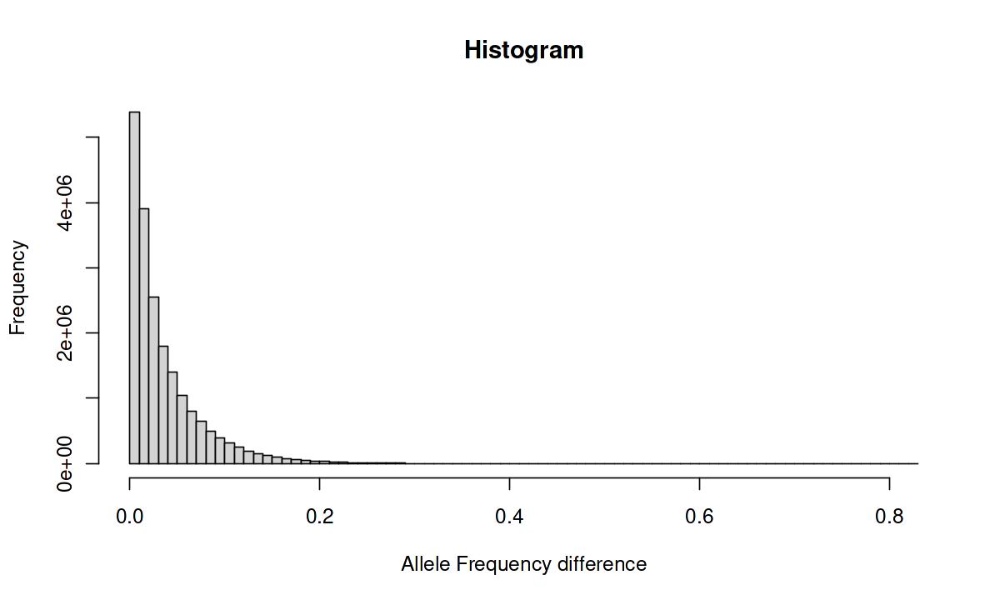

In [80]:
options(repr.plot.width=10, repr.plot.height=6)
par(cex=1.2)
hist(MAF$dp, breaks = 100, xlab='Allele Frequency difference', main = 'Histogram')

## Site Fst

In [81]:
baseDIR="~/snap_hap/genome_scans"
fst = foreach(chrom=c(1:8), .combine=rbind) %do% {
                    fileName = file.path(baseDIR, 'popgenStats', paste0('MY_Chr',chrom,'_Fst.weir.fst'))
                    tmpFile = fread(fileName, header=T)
                }

In [82]:
str(fst)

Classes ‘data.table’ and 'data.frame':	22095743 obs. of  3 variables:
 $ CHROM                 : chr  "Chr1" "Chr1" "Chr1" "Chr1" ...
 $ POS                   : int  3817 3850 3873 3881 3917 3922 3946 3981 3992 3994 ...
 $ WEIR_AND_COCKERHAM_FST: num  -0.003888 0.01304 0.005199 0.000681 -0.002997 ...
 - attr(*, ".internal.selfref")=<externalptr> 


In [87]:
cat('Mean per-site Fst between MF & YF:', mean(fst[WEIR_AND_COCKERHAM_FST > 0]$WEIR_AND_COCKERHAM_FST, na.rm=TRUE))

cat('\n\nMean per-site Fst between MF & YF for each chromosome')
cat('\nChr1\t', mean(fst[CHROM=='Chr1' & WEIR_AND_COCKERHAM_FST > 0]$WEIR_AND_COCKERHAM_FST, na.rm=TRUE))
cat('\nChr2\t', mean(fst[CHROM=='Chr2' & WEIR_AND_COCKERHAM_FST > 0]$WEIR_AND_COCKERHAM_FST, na.rm=TRUE))
cat('\nChr3\t', mean(fst[CHROM=='Chr3' & WEIR_AND_COCKERHAM_FST > 0]$WEIR_AND_COCKERHAM_FST, na.rm=TRUE))
cat('\nChr4\t', mean(fst[CHROM=='Chr4' & WEIR_AND_COCKERHAM_FST > 0]$WEIR_AND_COCKERHAM_FST, na.rm=TRUE))
cat('\nChr5\t', mean(fst[CHROM=='Chr5' & WEIR_AND_COCKERHAM_FST > 0]$WEIR_AND_COCKERHAM_FST, na.rm=TRUE))
cat('\nChr6\t', mean(fst[CHROM=='Chr6' & WEIR_AND_COCKERHAM_FST > 0]$WEIR_AND_COCKERHAM_FST, na.rm=TRUE))
cat('\nChr7\t', mean(fst[CHROM=='Chr7' & WEIR_AND_COCKERHAM_FST > 0]$WEIR_AND_COCKERHAM_FST, na.rm=TRUE))
cat('\nChr8\t', mean(fst[CHROM=='Chr8' & WEIR_AND_COCKERHAM_FST > 0]$WEIR_AND_COCKERHAM_FST, na.rm=TRUE))

Mean per-site Fst between MF & YF: 0.01962354

Mean per-site Fst between MF & YF for each chromosome
Chr1	 0.0194141
Chr2	 0.022618
Chr3	 0.01643494
Chr4	 0.02086887
Chr5	 0.02102503
Chr6	 0.01945449
Chr7	 0.02085447
Chr8	 0.01500559

## Site pi

In [10]:
baseDIR="~/snap_hap/genome_scans"
piM = foreach(chrom=c(1:8), .combine=rbind) %do% {
                    fileName = file.path(baseDIR, 'popgenStats', paste0('MF_Chr',chrom,'_pi.sites.pi'))
                    tmpFile = fread(fileName, header=T)
                }

piY = foreach(chrom=c(1:8), .combine=rbind) %do% {
                    fileName = file.path(baseDIR, 'popgenStats', paste0('YF_Chr',chrom,'_pi.sites.pi'))
                    tmpFile = fread(fileName, header=T)
                }

In [11]:
str(piM)

Classes ‘data.table’ and 'data.frame':	22095743 obs. of  3 variables:
 $ CHROM: chr  "Chr1" "Chr1" "Chr1" "Chr1" ...
 $ POS  : int  3817 3850 3873 3881 3917 3922 3946 3981 3992 3994 ...
 $ PI   : num  0.3937 0.2972 0 0.0133 0.4832 ...
 - attr(*, ".internal.selfref")=<externalptr> 


In [90]:
cat('pi within MF (per site)')
cat('\nFor whole genome:', mean(piM[PI>=0]$PI, na.rm=TRUE))
cat('\nChr1:', mean(piM[CHROM=='Chr1' & PI>=0]$PI, na.rm=TRUE))
cat('\nChr2:', mean(piM[CHROM=='Chr2' & PI>=0]$PI, na.rm=TRUE))
cat('\nChr3:', mean(piM[CHROM=='Chr3' & PI>=0]$PI, na.rm=TRUE))
cat('\nChr4:', mean(piM[CHROM=='Chr4' & PI>=0]$PI, na.rm=TRUE))
cat('\nChr5:', mean(piM[CHROM=='Chr5' & PI>=0]$PI, na.rm=TRUE))
cat('\nChr6:', mean(piM[CHROM=='Chr6' & PI>=0]$PI, na.rm=TRUE))
cat('\nChr7:', mean(piM[CHROM=='Chr7' & PI>=0]$PI, na.rm=TRUE))
cat('\nChr8:', mean(piM[CHROM=='Chr8' & PI>=0]$PI, na.rm=TRUE))

pi within MF (per site)
For whole genome: 0.1509474
Chr1: 0.1578719
Chr2: 0.149948
Chr3: 0.1508768
Chr4: 0.1477743
Chr5: 0.1543095
Chr6: 0.1460726
Chr7: 0.1512201
Chr8: 0.1477523

In [91]:
cat('pi within YF (per site)')
cat('\nFor whole genome:', mean(piY[PI>=0]$PI, na.rm=TRUE))
cat('\nChr1:', mean(piY[CHROM=='Chr1' & PI>=0]$PI, na.rm=TRUE))
cat('\nChr2:', mean(piY[CHROM=='Chr2' & PI>=0]$PI, na.rm=TRUE))
cat('\nChr3:', mean(piY[CHROM=='Chr3' & PI>=0]$PI, na.rm=TRUE))
cat('\nChr4:', mean(piY[CHROM=='Chr4' & PI>=0]$PI, na.rm=TRUE))
cat('\nChr5:', mean(piY[CHROM=='Chr5' & PI>=0]$PI, na.rm=TRUE))
cat('\nChr6:', mean(piY[CHROM=='Chr6' & PI>=0]$PI, na.rm=TRUE))
cat('\nChr7:', mean(piY[CHROM=='Chr7' & PI>=0]$PI, na.rm=TRUE))
cat('\nChr8:', mean(piY[CHROM=='Chr8' & PI>=0]$PI, na.rm=TRUE))

pi within YF (per site)
For whole genome: 0.1534391
Chr1: 0.161221
Chr2: 0.1526803
Chr3: 0.153134
Chr4: 0.1487915
Chr5: 0.1580204
Chr6: 0.1482444
Chr7: 0.1525687
Chr8: 0.1503243

## Window-based stats

In [12]:
baseDIR="~/snap_hap/genome_scans"
stats_Win10kB = foreach(chrom=c(1:8), .combine=rbind) %do% {
                    fileName = file.path(baseDIR, 'popgenStats', paste0('MY_Chr',chrom,'_w10000.csv.gz'))
                    tmpFile = fread(fileName, header=T)
                }

In [13]:
stats_Win10kB = stats_Win10kB %>% 
        # Compute chromosome size
        group_by(scaffold) %>% summarise(chromLength = max(end)) %>% 
    
        # Calculate cumulative position of each chromosome
        mutate(total = cumsum(chromLength)-chromLength) %>% select(-chromLength) %>%
    
        # Add this info to the initial dataset
        left_join(stats_Win10kB, ., by=c("scaffold"="scaffold")) %>%
    
        # Add a cumulative position of each SNP
        arrange(scaffold, end) %>%
        mutate(midCum = mid+total)

In [14]:
str(stats_Win10kB)

Classes ‘data.table’ and 'data.frame':	50881 obs. of  11 variables:
 $ scaffold : chr  "Chr1" "Chr1" "Chr1" "Chr1" ...
 $ start    : int  1 10001 20001 30001 40001 50001 60001 70001 80001 90001 ...
 $ end      : int  10000 20000 30000 40000 50000 60000 70000 80000 90000 100000 ...
 $ mid      : num  6816 15620 26104 32882 42760 ...
 $ sites    : int  239 219 222 66 1 25 252 295 299 209 ...
 $ pi_MF    : num  0.229 0.144 0.16 0.163 0 ...
 $ pi_YF    : num  0.235 0.148 0.166 0.184 0 ...
 $ dxy_MF_YF: num  0.232 0.146 0.163 0.173 0 ...
 $ Fst_MF_YF: num  -0.0007 0 -0.0003 0.0003 NaN -0.0016 0.0044 0.0095 0.0099 0.004 ...
 $ total    : int  0 0 0 0 0 0 0 0 0 0 ...
 $ midCum   : num  6816 15620 26104 32882 42760 ...
 - attr(*, ".internal.selfref")=<externalptr> 


In [15]:
axisdf = stats_Win10kB %>%
        group_by(scaffold) %>% summarize(chromCenter = (max(midCum, na.rm=T) + min(midCum, na.rm=T))/2) %>%
        mutate(col = rep(c('grey60','grey10'), 4))
print(axisdf)

# A tibble: 8 × 3
  scaffold chromCenter col   
  <chr>          <dbl> <chr> 
1 Chr1       35959628  grey60
2 Chr2      110481686. grey10
3 Chr3      181659522. grey60
4 Chr4      241702118. grey10
5 Chr5      304644128. grey60
6 Chr6      367994816  grey10
7 Chr7      423619160. grey60
8 Chr8      480104885  grey10


In [19]:
#CREMOSA Chr1:500000-1500000
stats_Win10kB_CRE = stats_Win10kB[sites >= 10][scaffold == 'Chr1' & mid>=500000 & mid <=1500000]

#AURINA Chr2:600000-1600000
stats_Win10kB_AUR = stats_Win10kB[sites >= 10][scaffold == 'Chr2' & mid>=600000 & mid <=1600000]

#FLAVIA Chr2:52000000-54500000
stats_Win10kB_FLA = stats_Win10kB[sites >= 10][scaffold == 'Chr2' & mid>=52000000 & mid <=54500000]

#SULF Chr4:37500000-39000000
stats_Win10kB_SULF = stats_Win10kB[sites >= 10][scaffold == 'Chr4' & mid>=37500000 & mid <=39000000]

#RUBIA Chr5:6000000-7000000
stats_Win10kB_RUBIA = stats_Win10kB[sites >= 10][scaffold == 'Chr5' & mid>=6000000 & mid <=7000000]

#RosEL Chr6:52500000-53500000
stats_Win10kB_ROSEL = stats_Win10kB[sites >= 10][scaffold == 'Chr6' & mid>=52500000 & mid <=53500000]

In [16]:
# options(repr.plot.width)
cat('Mean Fst (10kb non-overlapping window) between MF & YF')
summary(stats_Win10kB$Fst_MF_YF)

Mean Fst (10kb non-overlapping window) between MF & YF

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
-0.0032  0.0012  0.0035  0.0056  0.0072  0.3679    1665 

## Plots

### Fst across the genome

In [21]:
plt_Fst = ggplot(stats_Win10kB[sites >= 10], aes(x=midCum, y=Fst_MF_YF)) +
    
    # Show all points
    geom_point(aes(color=as.factor(scaffold)), alpha=1, size=1.3, pch=1) +
    scale_color_manual(values = rep(c("grey60", "grey10"), 4)) +
    
    # Axes and labels:
    scale_x_continuous(expand = c(0, 0), label=axisdf$scaffold, breaks=axisdf$chromCenter) +
    scale_y_continuous(expand = c(0, 0), limits=c(0,0.4)) +   # remove space between plot area and x axis
    labs(x='', y='Fst', title='Fst between magenta and yellow flank (10kb non-overlapping windows)') +
    # Custom the theme:
    plot_theme + 
    theme(legend.position = "none",
          axis.title = element_text(size = 15),
          axis.text = element_text(size = 12)) +

    ## Colour regions of interest
    geom_point(data = stats_Win10kB_CRE, col = "magenta", alpha=1, size=2, pch=19) +
    geom_point(data = stats_Win10kB_AUR, col = "magenta", alpha=1, size=2, pch=19) +
    geom_point(data = stats_Win10kB_FLA, col = "magenta", alpha=1, size=2, pch=19) +
    geom_point(data = stats_Win10kB_SULF, col = "magenta", alpha=1, size=2, pch=19) +
    geom_point(data = stats_Win10kB_RUBIA, col = "magenta", alpha=1, size=2, pch=19) +
    geom_point(data = stats_Win10kB_ROSEL, col = "magenta", alpha=1, size=2, pch=19)

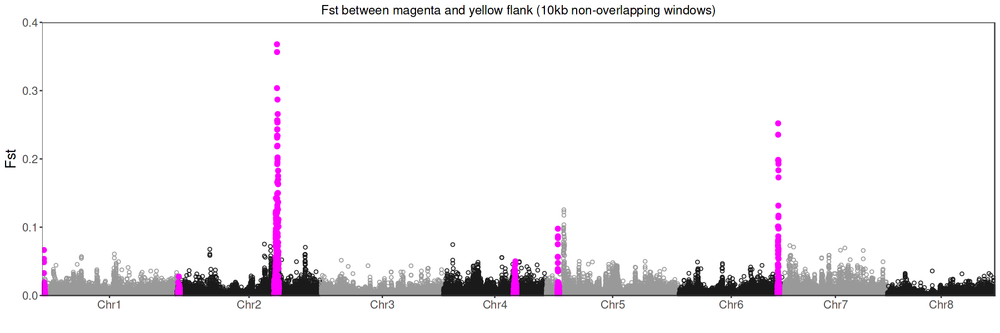

In [22]:
options(repr.plot.width=15, repr.plot.height=5, warn=-1)
plt_Fst

In [23]:
ggsave(plt_Fst, file = './_figures/plt_Fst-MF-YF_10kB.pdf', width=8, height=3)

### dxy across the genome

In [24]:
plt_dxy = ggplot(stats_Win10kB[sites >= 10], aes(x=midCum, y=dxy_MF_YF)) +
    
    # Show all points
    geom_point(aes(color=as.factor(scaffold)), alpha=1, size=1.3, pch=1) +
    scale_color_manual(values = rep(c("grey60", "grey10"), 4)) +
    
    # Axes and labels:
    scale_x_continuous(label=axisdf$scaffold, breaks=axisdf$chromCenter) +
    scale_y_continuous(expand = c(0, 0), limits=c(0,1)) +   # remove space between plot area and x axis
    labs(x='', y='dxy', title='Dxy between magenta and yellow flank (10kb non-overlapping windows)') +
    # Custom the theme:
    plot_theme + 
    theme(legend.position = "none",
          axis.title = element_text(size = 15),
          axis.text = element_text(size = 12)) +
    
    ## Colour regions of interest
    geom_point(data = stats_Win10kB_CRE, col = "magenta", alpha=1, size=2, pch=19) +
    geom_point(data = stats_Win10kB_AUR, col = "magenta", alpha=1, size=2, pch=19) +
    geom_point(data = stats_Win10kB_FLA, col = "magenta", alpha=1, size=2, pch=19) +
    geom_point(data = stats_Win10kB_SULF, col = "magenta", alpha=1, size=2, pch=19) +
    geom_point(data = stats_Win10kB_RUBIA, col = "magenta", alpha=1, size=2, pch=19) +
    geom_point(data = stats_Win10kB_ROSEL, col = "magenta", alpha=1, size=2, pch=19)

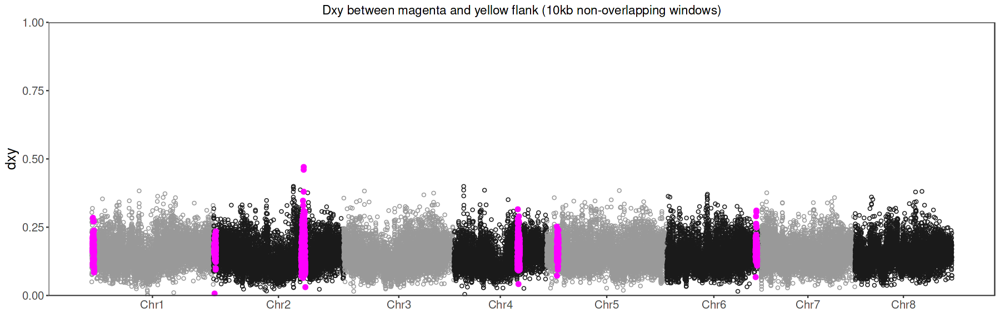

In [25]:
options(repr.plot.width=15, repr.plot.height=5, warn=-1)
plt_dxy

In [26]:
ggsave(plt_dxy, file = './_figures/plt_dxy-MF-YF_10kB.pdf', width=8, height=3)

### Allele frequency difference across the genome

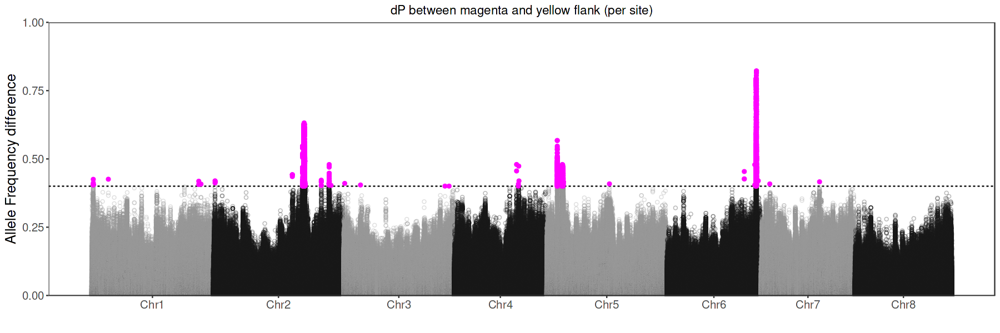

In [27]:
options(repr.plot.width=15, repr.plot.height=5, warn=-1)
ggplot(MAF, aes(x=posCum, y=dp)) +
    
    # Show all points
    geom_point(aes(color=as.factor(scaffold)), alpha=0.3, size=1.3, pch=1) +
    scale_color_manual(values = rep(c("grey60", "grey10"), 4)) +
    
    # Axes and labels:
    scale_x_continuous(label=axisdf$scaffold, breaks=axisdf$chromCenter) +
    scale_y_continuous(expand = c(0, 0), limits = c(0,1)) +   # remove space between plot area and x axis
    labs(x='', y='Allele Frequency difference', title='dP between magenta and yellow flank (per site)') +

    # Theme
    plot_theme + 
    theme(legend.position = "none",
          axis.title = element_text(size = 15),
          axis.text = element_text(size = 12)) +
    geom_hline(yintercept=0.4, lty=2) +

    ## Colour those which have dp > 0.4
    geom_point(data = MAF[dp>0.4], col='magenta', size=1.5, pch=19)

In [28]:
plt_dP = ggplot(MAF, aes(x=posCum, y=dp)) +
    
    # Show all points
    geom_point(aes(color=as.factor(scaffold)), alpha=0.3, size=1.3, pch=1) +
    scale_color_manual(values = rep(c("grey60", "grey10"), 4)) +
    
    # Axes and labels:
    scale_x_continuous(label=axisdf$scaffold, breaks=axisdf$chromCenter) +
    scale_y_continuous(expand = c(0, 0), limits = c(0,1)) +   # remove space between plot area and x axis
    labs(x='', y='Allele Frequency difference', title='dP between magenta and yellow flank (per site)') +

    # Theme
    plot_theme + 
    theme(legend.position = "none",
          axis.title = element_text(size = 15),
          axis.text = element_text(size = 12)) +
    geom_hline(yintercept=0.4, lty=2) +

    ## Colour those which have dp > 0.4
    geom_point(data = MAF[dp>0.4], col='magenta', size=1.5, pch=19)

ggsave(plt_dP, file='./_figures/test.pdf', width=15, height=4)

### Fst 10kb window 1kb step in RosEl 

In [18]:
stats_Win10k_step1k_RosEL = fread('./popgenStats/MY_RosEl_coordinate_w10000_s1000.csv.gz', header=T)

### dxy vs pi

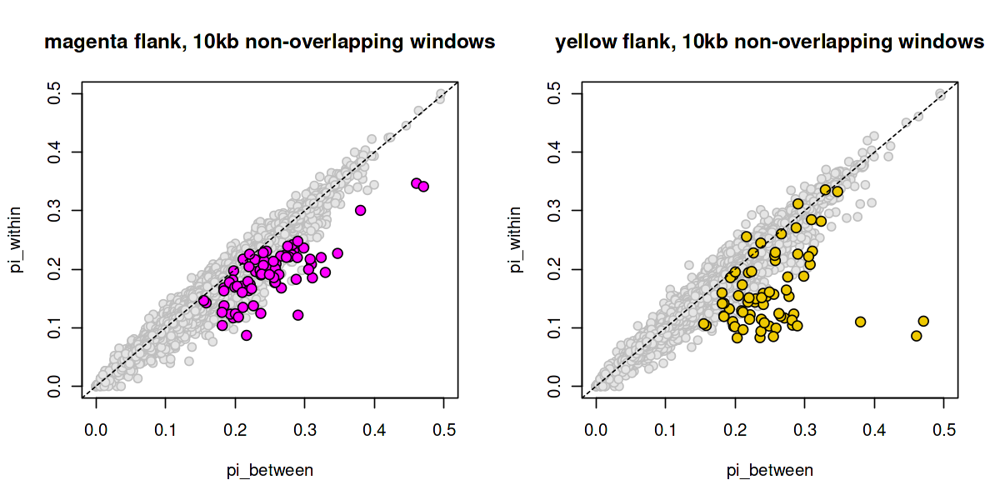

In [29]:
options(repr.plot.width=10, repr.plot.height=5)

par(mfrow=c(1,2))
plot(pi_MF~dxy_MF_YF, stats_Win10kB, pch=21, col='grey', bg='grey90', alpha=0.5,
     xlab='pi_between', ylab='pi_within', main='magenta flank, 10kb non-overlapping windows', 
     xlim=c(0,0.5), ylim=c(0,0.5))
points(pi_MF~dxy_MF_YF, stats_Win10kB[Fst_MF_YF>0.1], col='black', bg='magenta', pch=21, cex=1.2)
abline(a=0, b=1, lty=2)

plot(pi_YF~dxy_MF_YF, stats_Win10kB, pch=21, col='grey', bg='grey90', alpha=0.5,
     xlab='pi_between', ylab='pi_within', main='yellow flank, 10kb non-overlapping windows', 
     xlim=c(0,0.5), ylim=c(0,0.5))
points(pi_YF~dxy_MF_YF, stats_Win10kB[Fst_MF_YF>0.1], col='black', bg='gold2', pch=21, cex=1.2)
abline(a=0, b=1, lty=2)

In [30]:
# pdf()

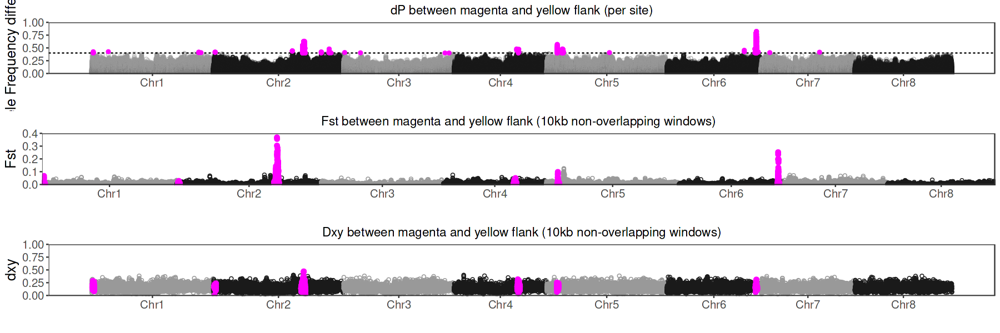

In [31]:
## Save plots
options(repr.plot.width=15, replr.plot.height=15)
grid.arrange(plt_dP, plt_Fst, plt_dxy, ncol=1)

## Regions of interest

In [31]:
### CREMOSA Chr1:500000-1500000
stats_Win10kB_CRE = stats_Win10kB[sites >= 10][scaffold == 'Chr1' & mid>=500000 & mid <=1500000]
MAF_CRE = MAF[scaffold=='Chr1' & position>=500000 & position<=1500000]
fst_CRE = fst[CHROM=='Chr1' & POS>=500000 & POS<=1500000]
piM_CRE = piM[CHROM=='Chr1' & POS>=500000 & POS<=1500000]
piY_CRE = piY[CHROM=='Chr1' & POS>=500000 & POS<=1500000]

### AURINA Chr2:600000-1600000
stats_Win10kB_AUR = stats_Win10kB[sites >= 10][scaffold == 'Chr2' & mid>=600000 & mid <=1600000]
MAF_AUR = MAF[scaffold=='Chr2' & position>=600000 & position<=1600000]
fst_AUR = fst[CHROM=='Chr2' & POS>=600000 & POS<=1600000]
piM_AUR = piM[CHROM=='Chr2' & POS>=600000 & POS<=1600000]
piY_AUR = piY[CHROM=='Chr2' & POS>=600000 & POS<=1600000]

### FLAVIA Chr2:52000000-54500000
stats_Win10kB_FLA = stats_Win10kB[sites >= 10][scaffold == 'Chr2' & mid>=52000000 & mid <=54500000]
MAF_FLA = MAF[scaffold=='Chr2' & position>=52000000 & position<=54500000]
fst_FLA = fst[CHROM=='Chr2' & POS>=52000000 & POS<=54500000]
piM_FLA = piM[CHROM=='Chr2' & POS>=52000000 & POS<=54500000]
piY_FLA = piY[CHROM=='Chr2' & POS>=52000000 & POS<=54500000]

### SULF Chr4:37500000-39000000
stats_Win10kB_SULF = stats_Win10kB[sites >= 10][scaffold == 'Chr4' & mid>=37500000 & mid <=39000000]
MAF_SULF = MAF[scaffold=='Chr4' & position>=37500000 & position<=39000000]
fst_SULF = fst[CHROM=='Chr4' & POS>=37500000 & POS<=39000000]
piM_SULF = piM[CHROM=='Chr4' & POS>=37500000 & POS<=39000000]
piY_SULF = piY[CHROM=='Chr4' & POS>=37500000 & POS<=39000000]

### RUBIA Chr5:6000000-7000000
stats_Win10kB_RUBIA = stats_Win10kB[sites >= 10][scaffold == 'Chr5' & mid>=6000000 & mid <=7000000]
MAF_RUBIA = MAF[scaffold=='Chr5' & position>=6000000 & position<=7000000]
fst_RUBIA = fst[CHROM=='Chr5' & POS>=6000000 & POS<=7000000]
piM_RUBIA = piM[CHROM=='Chr5' & POS>=6000000 & POS<=7000000]
piY_RUBIA = piY[CHROM=='Chr5' & POS>=6000000 & POS<=7000000]

### RosEl Chr6:52500000-53500000
stats_Win10kB_ROSEL = stats_Win10kB[sites >= 10][scaffold == 'Chr6' & mid>=52500000 & mid <=53500000]
MAF_ROSEL = MAF[scaffold=='Chr6' & position>=52500000 & position<=53500000]
fst_ROSEL = fst[CHROM=='Chr6' & POS>=52500000 & POS<=53500000]
piM_ROSEL = piM[CHROM=='Chr6' & POS>=52500000 & POS<=53500000]
piY_ROSEL = piY[CHROM=='Chr6' & POS>=52500000 & POS<=53500000]

### CREMOSA Chr1:500000-1500000

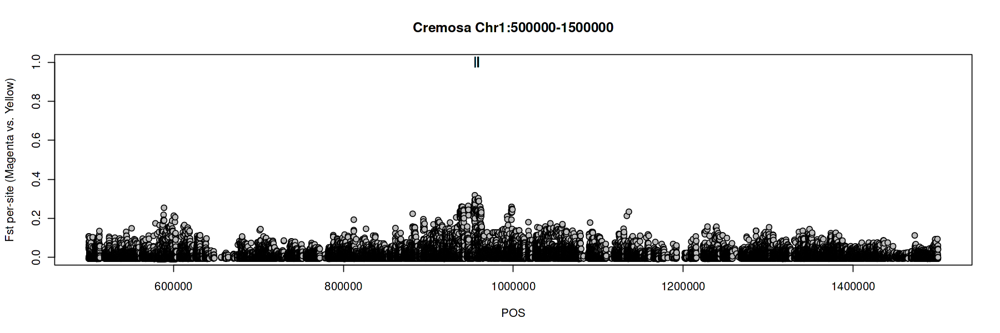

In [84]:
options(repr.plot.width=15, repr.plot.height=5)
plot(WEIR_AND_COCKERHAM_FST~POS, fst_CRE, ylim=c(0,1), 
     col='black', bg='grey', alpha=0.2, pch=21, 
     ylab='Fst per-site (Magenta vs. Yellow)', main='Cremosa Chr1:500000-1500000')
points(rep(1, nrow(MAF_CRE[dp>0.4]))~position, MAF_CRE[dp>0.4], pch='|')

In [85]:
pdf('./_figures/plt_Fst-perSite_Cremosa.pdf', width=15, height=4)
plot(WEIR_AND_COCKERHAM_FST~POS, fst_CRE, ylim=c(0,1), 
     col='black', bg='grey', alpha=0.2, pch=21, 
     ylab='Fst per-site (Magenta vs. Yellow)', main='Cremosa Chr1:500000-1500000')
points(rep(1, nrow(MAF_CRE[dp>0.4]))~position, MAF_CRE[dp>0.4], pch='|')
dev.off()

png 
  2

### AURINA Chr2:600000-1600000

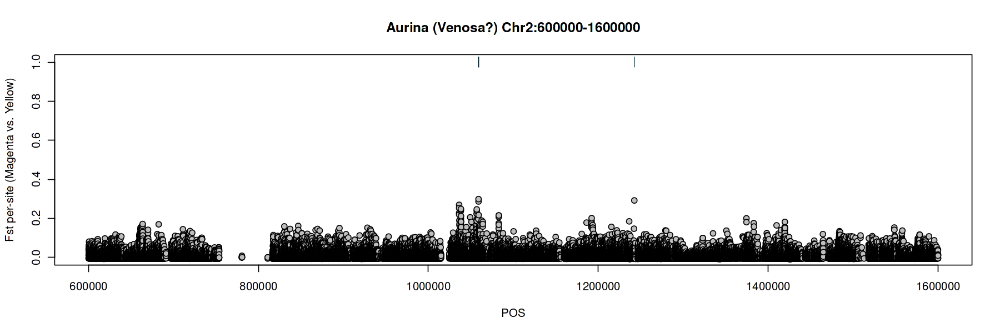

In [87]:
options(repr.plot.width=15, repr.plot.height=5)
plot(WEIR_AND_COCKERHAM_FST~POS, fst_AUR, ylim=c(0,1), 
     col='black', bg='grey', alpha=0.2, pch=21, 
     ylab='Fst per-site (Magenta vs. Yellow)', main='Aurina (Venosa?) Chr2:600000-1600000')
points(rep(1, nrow(MAF_AUR[dp>0.4]))~position, MAF_AUR[dp>0.4], pch='|')

In [88]:
pdf('./_figures/plt_Fst-perSite_Aurina.pdf', width=15, height=4)
plot(WEIR_AND_COCKERHAM_FST~POS, fst_AUR, ylim=c(0,1), 
     col='black', bg='grey', alpha=0.2, pch=21, 
     ylab='Fst per-site (Magenta vs. Yellow)', main='Aurina (Venosa?) Chr2:600000-1600000')
points(rep(1, nrow(MAF_AUR[dp>0.4]))~position, MAF_AUR[dp>0.4], pch='|')
dev.off()

png 
  2

### FLAVIA Chr2:52000000-54500000


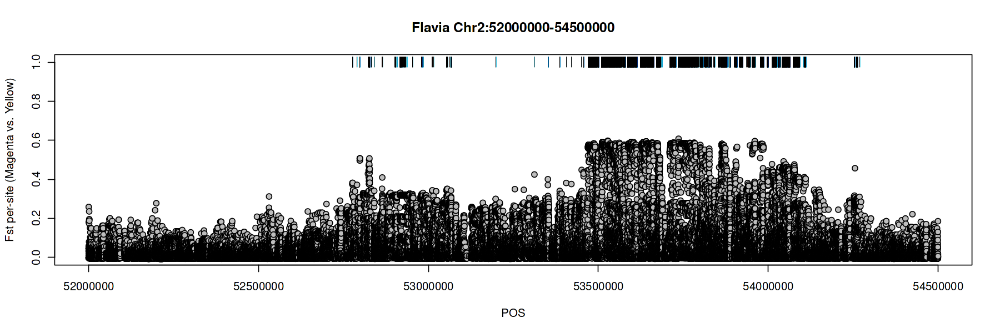

In [90]:
options(repr.plot.width=15, repr.plot.height=5)
plot(WEIR_AND_COCKERHAM_FST~POS, fst_FLA, ylim=c(0,1), 
     col='black', bg='grey', alpha=0.2, pch=21,
     ylab='Fst per-site (Magenta vs. Yellow)', main='Flavia Chr2:52000000-54500000')
points(rep(1, nrow(MAF_FLA[dp>0.4]))~position, MAF_FLA[dp>0.4], pch='|')

In [91]:
pdf('./_figures/plt_Fst-perSite_Flavia.pdf', width=15, height=4)
plot(WEIR_AND_COCKERHAM_FST~POS, fst_FLA, ylim=c(0,1), 
     col='black', bg='grey', alpha=0.2, pch=21,
     ylab='Fst per-site (Magenta vs. Yellow)', main='Flavia Chr2:52000000-54500000')
points(rep(1, nrow(MAF_FLA[dp>0.4]))~position, MAF_FLA[dp>0.4], pch='|')
dev.off()

png 
  2

### SULF Chr4:37500000-39000000

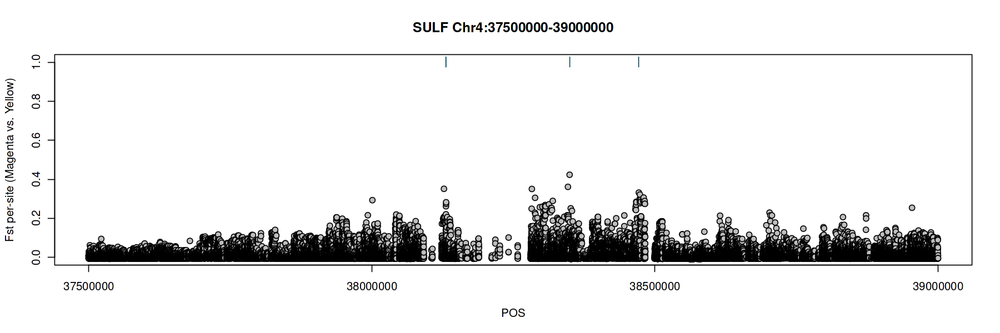

In [92]:
options(repr.plot.width=15, repr.plot.height=5)
plot(WEIR_AND_COCKERHAM_FST~POS, fst_SULF, ylim=c(0,1), 
     col='black', bg='grey', alpha=0.2, pch=21,
     ylab='Fst per-site (Magenta vs. Yellow)', main='SULF Chr4:37500000-39000000')
points(rep(1, nrow(MAF_SULF[dp>0.4]))~position, MAF_SULF[dp>0.4], pch='|')

In [93]:
pdf('./_figures/plt_Fst-perSite_SULF.pdf', width=15, height=4)
plot(WEIR_AND_COCKERHAM_FST~POS, fst_SULF, ylim=c(0,1), 
     col='black', bg='grey', alpha=0.2, pch=21,
     ylab='Fst per-site (Magenta vs. Yellow)', main='SULF Chr4:37500000-39000000')
points(rep(1, nrow(MAF_SULF[dp>0.4]))~position, MAF_SULF[dp>0.4], pch='|')
dev.off()

png 
  2

### RUBIA Chr5:6000000-7000000

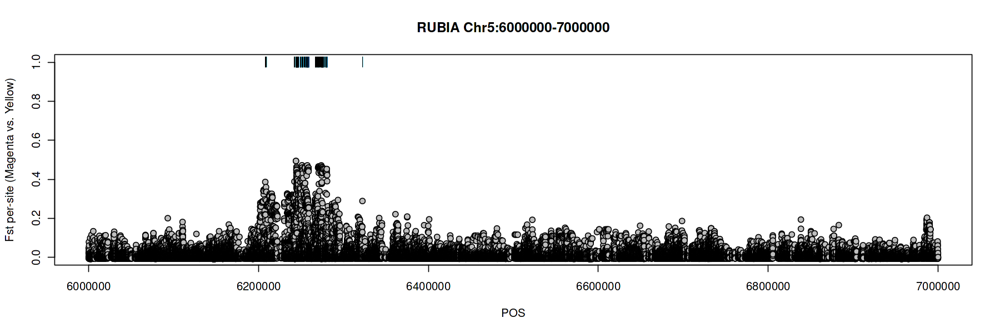

In [94]:
options(repr.plot.width=15, repr.plot.height=5)
plot(WEIR_AND_COCKERHAM_FST~POS, fst_RUBIA, ylim=c(0,1), col='black', bg='grey', alpha=0.2, pch=21,
         ylab='Fst per-site (Magenta vs. Yellow)', main='RUBIA Chr5:6000000-7000000')
points(rep(1, nrow(MAF_RUBIA[dp>0.4]))~position, MAF_RUBIA[dp>0.4], pch='|')

In [95]:
pdf('./_figures/plt_Fst-perSite_RUBIA.pdf', width=15, height=4)
plot(WEIR_AND_COCKERHAM_FST~POS, fst_RUBIA, ylim=c(0,1), col='black', bg='grey', alpha=0.2, pch=21,
         ylab='Fst per-site (Magenta vs. Yellow)', main='RUBIA Chr5:6000000-7000000')
points(rep(1, nrow(MAF_RUBIA[dp>0.4]))~position, MAF_RUBIA[dp>0.4], pch='|')
dev.off()

png 
  2

### RosEl Chr6:52500000-53500000

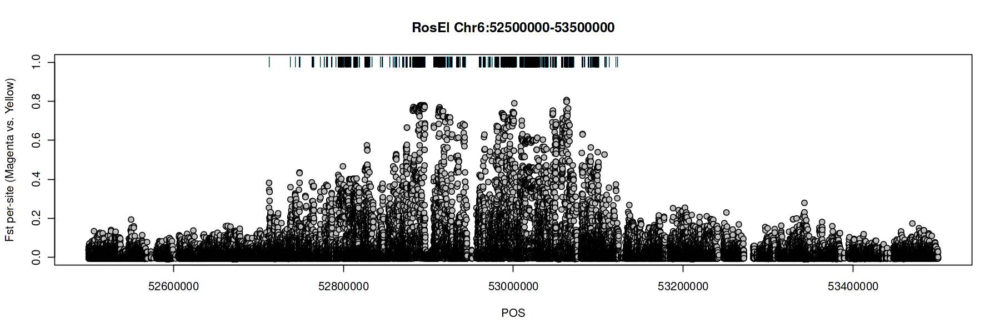

In [33]:
options(repr.plot.width=15, repr.plot.height=5)
plot(WEIR_AND_COCKERHAM_FST~POS, fst_ROSEL, ylim=c(0,1), 
     col='black', bg='grey', alpha=0.2, pch=21,
    ylab='Fst per-site (Magenta vs. Yellow)', main='RosEl Chr6:52500000-53500000')
points(rep(1, nrow(MAF_ROSEL[dp>0.4]))~position, MAF_ROSEL[dp>0.4], pch='|')

In [97]:
pdf('./_figures/plt_Fst-perSite_ROSEL.pdf', width=15, height=4)
plot(WEIR_AND_COCKERHAM_FST~POS, fst_ROSEL, ylim=c(0,1), 
     col='black', bg='grey', alpha=0.2, pch=21,
    ylab='Fst per-site (Magenta vs. Yellow)', main='RosEl Chr6:52500000-53500000')
points(rep(1, nrow(MAF_ROSEL[dp>0.4]))~position, MAF_ROSEL[dp>0.4], pch='|')
dev.off()

png 
  2

In [63]:
mean(fst[WEIR_AND_COCKERHAM_FST>=0 & CHROM=='Chr6']$WEIR_AND_COCKERHAM_FST, na.rm = T)
mean(piM[CHROM=='Chr6']$PI, na.rm=TRUE)
mean(piY[CHROM=='Chr6']$PI, na.rm=TRUE)

[1] 0.01945436

[1] 0.1460726

[1] 0.1482444

In [67]:
mean_Fst_Chr6 = mean(stats_Win10kB[scaffold=='Chr6' & Fst_MF_YF>=0 & sites>10]$Fst_MF_YF, na.rm=T)
mean_piM_Chr6 = mean(stats_Win10kB[scaffold=='Chr6' & pi_MF>=0 & sites>10]$pi_MF, na.rm=T)
mean_piY_Chr6 = mean(stats_Win10kB[scaffold=='Chr6' & pi_YF>=0 & sites>10]$pi_YF, na.rm=T)
mean_dxy_Chr6 = mean(stats_Win10kB[scaffold=='Chr6' & dxy_MF_YF>=0 & sites>10]$dxy_MF_YF, na.rm=T)

mean_Fst_RosEl1mb = mean(stats_Win10kB_ROSEL[scaffold=='Chr6' & Fst_MF_YF>=0 & sites>10]$Fst_MF_YF, na.rm=T)
mean_piM_RosEl1mb = mean(stats_Win10kB_ROSEL[scaffold=='Chr6' & pi_MF>=0 & sites>10]$pi_MF, na.rm=T)
mean_piY_RosEl1mb = mean(stats_Win10kB_ROSEL[scaffold=='Chr6' & pi_YF>=0 & sites>10]$pi_YF, na.rm=T)
mean_dxy_RosEl1mb = mean(stats_Win10kB_ROSEL[scaffold=='Chr6' & dxy_MF_YF>=0 & sites>10]$dxy_MF_YF, na.rm=T)

In [61]:
str(stats_Win10kB)

Classes ‘data.table’ and 'data.frame':	50881 obs. of  11 variables:
 $ scaffold : chr  "Chr1" "Chr1" "Chr1" "Chr1" ...
 $ start    : int  1 10001 20001 30001 40001 50001 60001 70001 80001 90001 ...
 $ end      : int  10000 20000 30000 40000 50000 60000 70000 80000 90000 100000 ...
 $ mid      : num  6816 15620 26104 32882 42760 ...
 $ sites    : int  239 219 222 66 1 25 252 295 299 209 ...
 $ pi_MF    : num  0.229 0.144 0.16 0.163 0 ...
 $ pi_YF    : num  0.235 0.148 0.166 0.184 0 ...
 $ dxy_MF_YF: num  0.232 0.146 0.163 0.173 0 ...
 $ Fst_MF_YF: num  -0.0007 0 -0.0003 0.0003 NaN -0.0016 0.0044 0.0095 0.0099 0.004 ...
 $ total    : int  0 0 0 0 0 0 0 0 0 0 ...
 $ midCum   : num  6816 15620 26104 32882 42760 ...
 - attr(*, ".internal.selfref")=<externalptr> 


Warning message in plot.window(...):
“"alpha" is not a graphical parameter”
Warning message in plot.xy(xy, type, ...):
“"alpha" is not a graphical parameter”
Warning message in axis(side = side, at = at, labels = labels, ...):
“"alpha" is not a graphical parameter”
Warning message in axis(side = side, at = at, labels = labels, ...):
“"alpha" is not a graphical parameter”
Warning message in box(...):
“"alpha" is not a graphical parameter”
Warning message in title(...):
“"alpha" is not a graphical parameter”


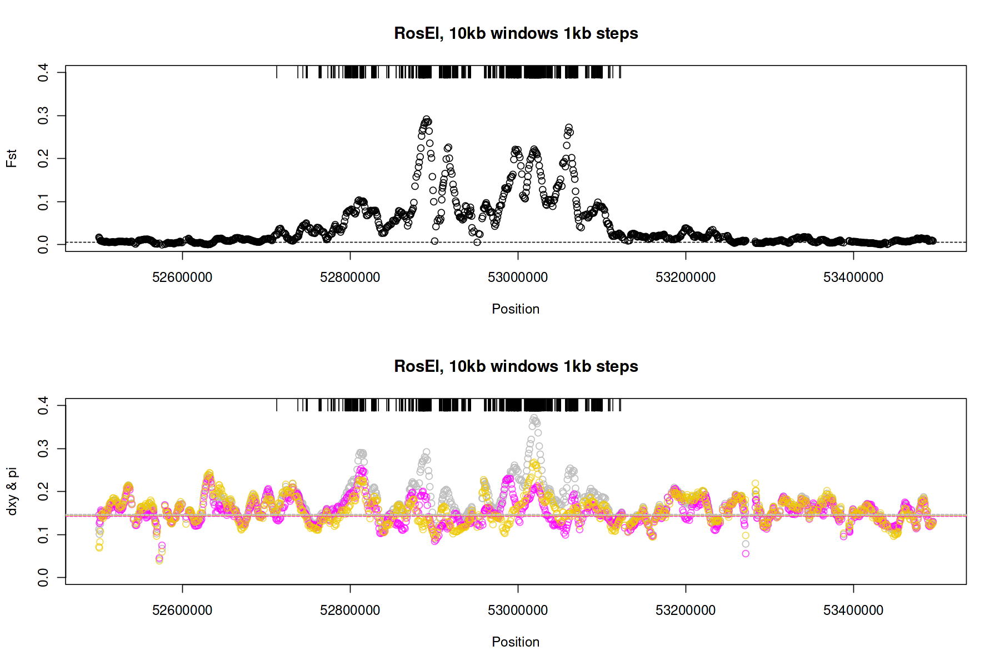

In [70]:
options(repr.plot.width=15, repr.plot.height=10)
par(mfrow=c(2,1), cex=1.2)

## Fst plot
plot(Fst_MF_YF~mid, stats_Win10k_step1k_RosEL[sites>10], 
     ylim=c(0,0.4), ylab='Fst', xlab='Position', main='RosEl, 10kb windows 1kb steps')
points(rep(0.4, nrow(MAF_ROSEL[dp>0.4]))~position, MAF_ROSEL[dp>0.4], pch='|')
abline(h = mean_Fst_Chr6, lty = 2) # mean Fst across Chr6


## pi and dxy plot
plot(dxy_MF_YF~mid, stats_Win10k_step1k_RosEL[sites>10], col='grey', alpha=0.5,
     ylim=c(0,0.4), ylab='dxy & pi', xlab='Position', main='RosEl, 10kb windows 1kb steps')
points(pi_MF~mid, stats_Win10k_step1k_RosEL, col=alpha('magenta',0.7))
points(pi_YF~mid, stats_Win10k_step1k_RosEL, col=alpha('gold2',0.7))
points(rep(0.4, nrow(MAF_ROSEL[dp>0.4]))~position, MAF_ROSEL[dp>0.4], pch='|')
abline(h = mean_piM_Chr6, col='magenta', lty=2, lwd=2) # Mean piM Chr6
abline(h = mean_piY_Chr6, col='gold2', lty=2, lwd=2) # Mean piY Chr6
abline(h = mean_dxy_Chr6, col='grey', lty=2, lwd=2) # Mean dxy Chr6

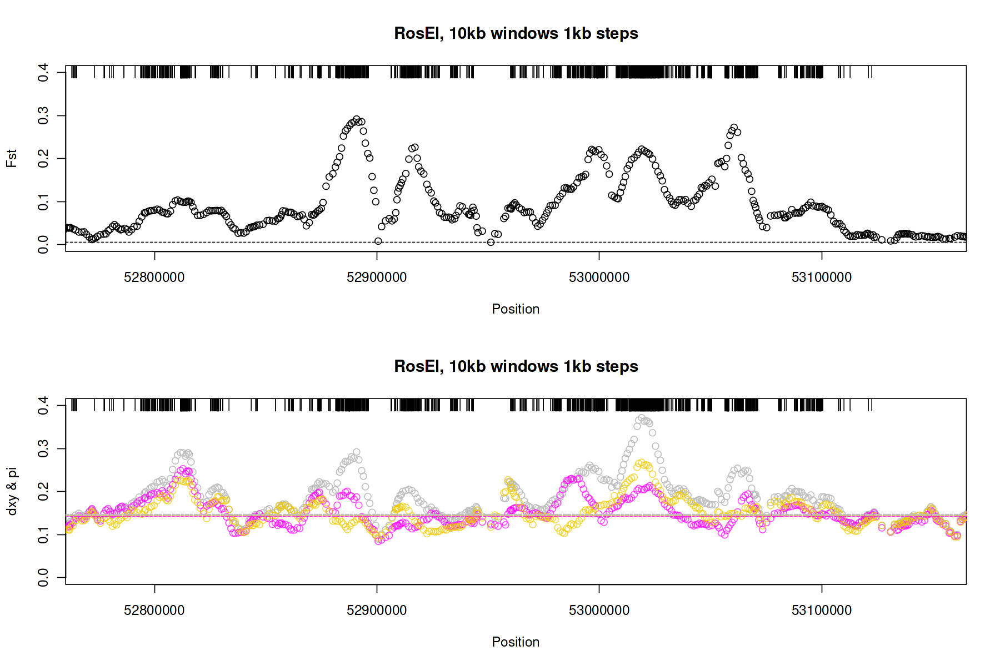

In [71]:
options(repr.plot.width=15, repr.plot.height=10)
par(mfrow=c(2,1), cex=1.2)
RosEL_zoomIn = c(52775014, 53149974)

## Fst plot
plot(Fst_MF_YF~mid, stats_Win10k_step1k_RosEL[sites>10], 
     ylim=c(0,0.4), xlim=RosEL_zoomIn, ylab='Fst', xlab='Position', main='RosEl, 10kb windows 1kb steps')
points(rep(0.4, nrow(MAF_ROSEL[dp>0.4]))~position, MAF_ROSEL[dp>0.4], pch='|')
abline(h = mean_Fst_Chr6, lty = 2) # mean Fst across Chr6

## pi and dxy plot
plot(dxy_MF_YF~mid, stats_Win10k_step1k_RosEL[sites>10], col=alpha('grey', 1),
     ylim=c(0,0.4), xlim=RosEL_zoomIn, ylab='dxy & pi', xlab='Position', main='RosEl, 10kb windows 1kb steps')
points(pi_MF~mid, stats_Win10k_step1k_RosEL, col=alpha('magenta',0.7))
points(pi_YF~mid, stats_Win10k_step1k_RosEL, col=alpha('gold2',0.7))
points(rep(0.4, nrow(MAF_ROSEL[dp>0.4]))~position, MAF_ROSEL[dp>0.4], pch='|')
abline(h = mean_piM_Chr6, col='magenta', lty=2, lwd=2) # Mean piM Chr6
abline(h = mean_piY_Chr6, col='gold2', lty=2, lwd=2) # Mean piY Chr6
abline(h = mean_dxy_Chr6, col='grey', lty=2, lwd=2) # Mean dxy Chr6

### Chr6: random neutral region

In [72]:
stats_Win10kB_Chr6 = stats_Win10kB[sites >= 10][scaffold == 'Chr6']
str(stats_Win10kB_Chr6)

Classes ‘data.table’ and 'data.frame':	5409 obs. of  11 variables:
 $ scaffold : chr  "Chr6" "Chr6" "Chr6" "Chr6" ...
 $ start    : int  10001 20001 30001 40001 80001 90001 100001 110001 120001 130001 ...
 $ end      : int  20000 30000 40000 50000 90000 100000 110000 120000 130000 140000 ...
 $ mid      : num  16714 21197 36356 42683 84432 ...
 $ sites    : int  175 105 749 43 82 70 142 318 453 315 ...
 $ pi_MF    : num  0.1122 0.1152 0.1596 0.0747 0.106 ...
 $ pi_YF    : num  0.1121 0.1111 0.1495 0.0582 0.0994 ...
 $ dxy_MF_YF: num  0.1125 0.1134 0.1544 0.0668 0.1027 ...
 $ Fst_MF_YF: num  0.0014 0.0011 -0.0005 0.0028 -0.0001 0.001 0.0019 0.0041 0.0021 0.002 ...
 $ total    : int  340140000 340140000 340140000 340140000 340140000 340140000 340140000 340140000 340140000 340140000 ...
 $ midCum   : num  3.4e+08 3.4e+08 3.4e+08 3.4e+08 3.4e+08 ...
 - attr(*, ".internal.selfref")=<externalptr> 


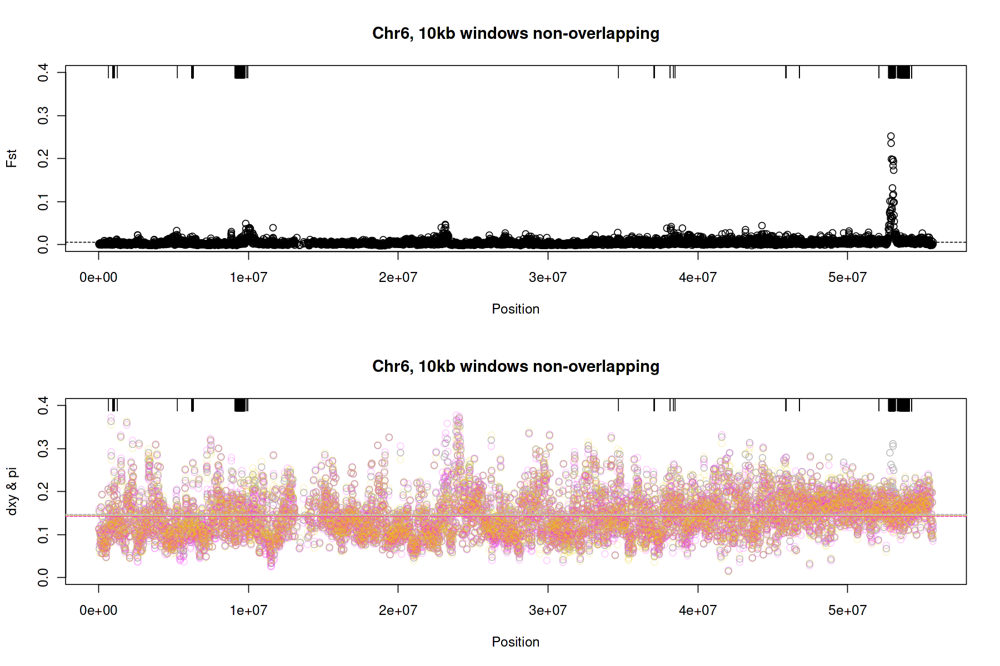

In [73]:
options(repr.plot.width=15, repr.plot.height=10)
par(mfrow=c(2,1), cex=1.2)

## Fst plot
plot(Fst_MF_YF~mid, stats_Win10kB_Chr6[sites>10], 
     ylim=c(0,0.4), #xlim=RosEL_zoomIn, 
     ylab='Fst', xlab='Position', main='Chr6, 10kb windows non-overlapping')
points(rep(0.4, nrow(MAF[dp>0.4]))~position, MAF[dp>0.4], pch='|')
abline(h = mean_Fst_Chr6, lty = 2) # mean Fst across Chr6

## pi and dxy plot
plot(dxy_MF_YF~mid, stats_Win10kB_Chr6[sites>10], col=alpha('grey', 1),
     ylim=c(0,0.4), #xlim=RosEL_zoomIn, 
     ylab='dxy & pi', xlab='Position', main='Chr6, 10kb windows non-overlapping')
points(pi_MF~mid, stats_Win10kB_Chr6[sites>10], col=alpha('magenta',0.2))
points(pi_YF~mid, stats_Win10kB_Chr6[sites>10], col=alpha('gold2',0.2))
points(rep(0.4, nrow(MAF[dp>0.4]))~position, MAF[dp>0.4], pch='|')
abline(h = mean_piM_Chr6, col='magenta', lty=2, lwd=2) # Mean piM Chr6
abline(h = mean_piY_Chr6, col='gold2', lty=2, lwd=2) # Mean piY Chr6
abline(h = mean_dxy_Chr6, col='grey', lty=2, lwd=2) # Mean dxy Chr6

In [26]:
str(fst)

Classes ‘data.table’ and 'data.frame':	22095743 obs. of  3 variables:
 $ CHROM                 : chr  "Chr1" "Chr1" "Chr1" "Chr1" ...
 $ POS                   : int  3817 3850 3873 3881 3917 3922 3946 3981 3992 3994 ...
 $ WEIR_AND_COCKERHAM_FST: num  -0.003888 0.01304 0.005199 0.000681 -0.002997 ...
 - attr(*, ".internal.selfref")=<externalptr> 


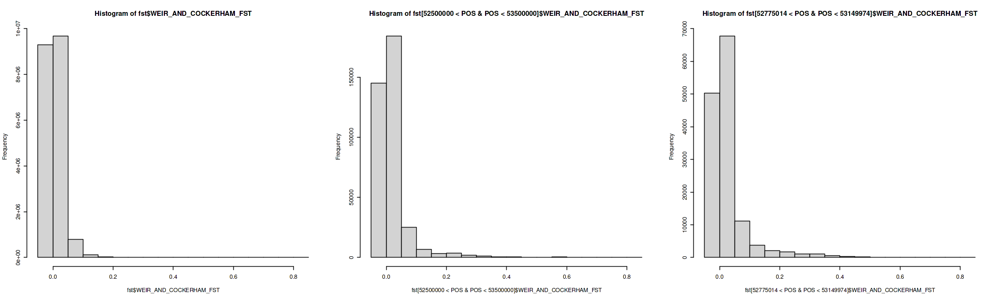

In [30]:
options(repr.plot.width=20, repr.plot.height=6)
RosEL_broad = c(52500000, 53500000)
RosEL_zoomIn = c(52775014, 53149974)

# Fst_MF_YF = stats_Win10kB[sites >= 10][scaffold == 'Chr6']
# par(mfrow=c(1,3))
# hist(stats_Win10kB_Chr6$Fst_MF_YF, breaks = 50)
# hist(stats_Win10kB_Chr6[RosEL_zoomIn[1] < mid & mid < RosEL_zoomIn[2]]$Fst_MF_YF, breaks = 50)
# hist(stats_Win10kB_Chr6[RosEL_zoomIn[1] < mid & mid < RosEL_zoomIn[2]]$Fst_MF_YF, breaks = 50)

fst_Chr6 = fst[CHROM == 'Chr6']
par(mfrow=c(1,3))
hist(fst$WEIR_AND_COCKERHAM_FST)
hist(fst[52500000 < POS & POS < 53500000]$WEIR_AND_COCKERHAM_FST)
hist(fst[52775014 < POS & POS < 53149974]$WEIR_AND_COCKERHAM_FST)

## Comparison: haplotag vs. poolseq

In [229]:
## Read all poolseq data
stats_poolSeq = foreach(fileName = Sys.glob('~/snap_hap/Amajus_poolSeq/output/Chr?_x*'),
                        .combine = rbind) %do% {
                    tmp = fread(fileName, header=T, fill=TRUE)
                    tmp
                }

In [230]:
stats_poolSeq$coordID = paste0('Chr', stats_poolSeq$LG,'_',stats_poolSeq$windowEnd)
str(stats_poolSeq)

Classes ‘data.table’ and 'data.frame':	49196 obs. of  3147 variables:
 $ scaffold               : chr  "Chr1_xaa" "Chr1_xaa" "Chr1_xaa" "Chr1_xaa" ...
 $ LG                     : int  1 1 1 1 1 1 1 1 1 1 ...
 $ cM                     : int  1 1 1 1 1 1 1 1 1 1 ...
 $ windowStart            : num  0 10000 20000 30000 40000 50000 60000 70000 80000 90000 ...
 $ windowEnd              : num  1e+04 2e+04 3e+04 4e+04 5e+04 6e+04 7e+04 8e+04 9e+04 1e+05 ...
 $ coverage               : num  0.328 0.437 0.371 0.173 0.234 ...
 $ poly_pool_1            : num  0.0465 0.0376 0.0684 0.1572 0.1427 ...
 $ poly_pool_2            : num  0.0374 0.04 0.0761 0.1405 0.1067 ...
 $ poly_pool_3            : num  0.0349 0.035 0.0652 0.15 0.0756 ...
 $ poly_pool_4            : num  0.0434 0.0337 0.0598 0.1489 0.0584 ...
 $ poly_pool_5            : num  0.0441 0.0368 0.0617 0.1451 0.065 ...
 $ poly_pool_6            : num  0.0354 0.0381 0.0912 0.1163 0.0579 ...
 $ poly_pool_7            : num  0.0368 0.0329 0.053

In [231]:
## Modify haplotag data before merging with poolseq data
stats_haplotag = stats_Win10kB
colnames(stats_haplotag)[2:3] = c('windowStart', 'windowEnd')
stats_haplotag$coordID = paste0(stats_haplotag$scaffold,'_',stats_haplotag$windowEnd)

In [232]:
## Merge poolseq and haplotag data
stats_merged = merge(stats_haplotag, stats_poolSeq[,-c(1:5)], by='coordID', all.x = TRUE)

In [233]:
str(stats_merged)

Classes ‘data.table’ and 'data.frame':	51302 obs. of  3153 variables:
 $ coordID                : chr  "Chr1_10000" "Chr1_100000" "Chr1_1000000" "Chr1_10000000" ...
 $ scaffold               : chr  "Chr1" "Chr1" "Chr1" "Chr1" ...
 $ windowStart            : int  1 90001 990001 9990001 10000001 10010001 10020001 10030001 10040001 10050001 ...
 $ windowEnd              : int  10000 100000 1000000 10000000 10010000 10020000 10030000 10040000 10050000 10060000 ...
 $ mid                    : num  6816 95221 995502 9993198 10005193 ...
 $ sites                  : int  239 209 540 207 426 476 781 615 283 536 ...
 $ pi_MF                  : num  0.229 0.282 0.206 0.108 0.105 ...
 $ pi_YF                  : num  0.2348 0.2751 0.2232 0.1181 0.0963 ...
 $ dxy_MF_YF              : num  0.232 0.281 0.222 0.115 0.101 ...
 $ Fst_MF_YF              : num  -0.0007 0.004 0.0167 0.0064 0.0025 0.0037 0.0101 0.012 0.0105 0.0154 ...
 $ total                  : int  0 0 0 0 0 0 0 0 0 0 ...
 $ midCum        

In [211]:
# plt_Fst = function(fst_values, dat){
#     ggplot(dat[sites >= 10], aes(x=midCum, y=fst_values)) +
    
#     # Show all points
#     geom_point(aes(color=as.factor(scaffold)), alpha=1, size=1.3, pch=1) +
#     scale_color_manual(values = rep(c("grey60", "grey10"), 4)) +
    
#     # Axes and labels:
#     scale_x_continuous(label=axisdf$scaffold, breaks=axisdf$chromCenter) +
#     scale_y_continuous(expand = c(0, 0), limits=c(0,0.4)) +   # remove space between plot area and x axis
#     labs(x='', y='Fst', title='Fst between magenta and yellow flank (10kb non-overlapping windows)') +
#     # Custom the theme:
#     plot_theme + 
#     theme(legend.position = "none",
#           axis.title = element_text(size = 15),
#           axis.text = element_text(size = 12)) +

#     ## Colour regions of interest
#     # geom_point(data = stats_Win10kB_CRE, col = "magenta", alpha=1, size=2, pch=19) +
#     # geom_point(data = stats_Win10kB_AUR, col = "magenta", alpha=1, size=2, pch=19) +
#     # geom_point(data = stats_Win10kB_FLA, col = "magenta", alpha=1, size=2, pch=19) +
#     # geom_point(data = stats_Win10kB_SULF, col = "magenta", alpha=1, size=2, pch=19) +
#     # geom_point(data = stats_Win10kB_RUBIA, col = "magenta", alpha=1, size=2, pch=19) +
#     # geom_point(data = stats_Win10kB_ROSEL, col = "magenta", alpha=1, size=2, pch=19)    
# }

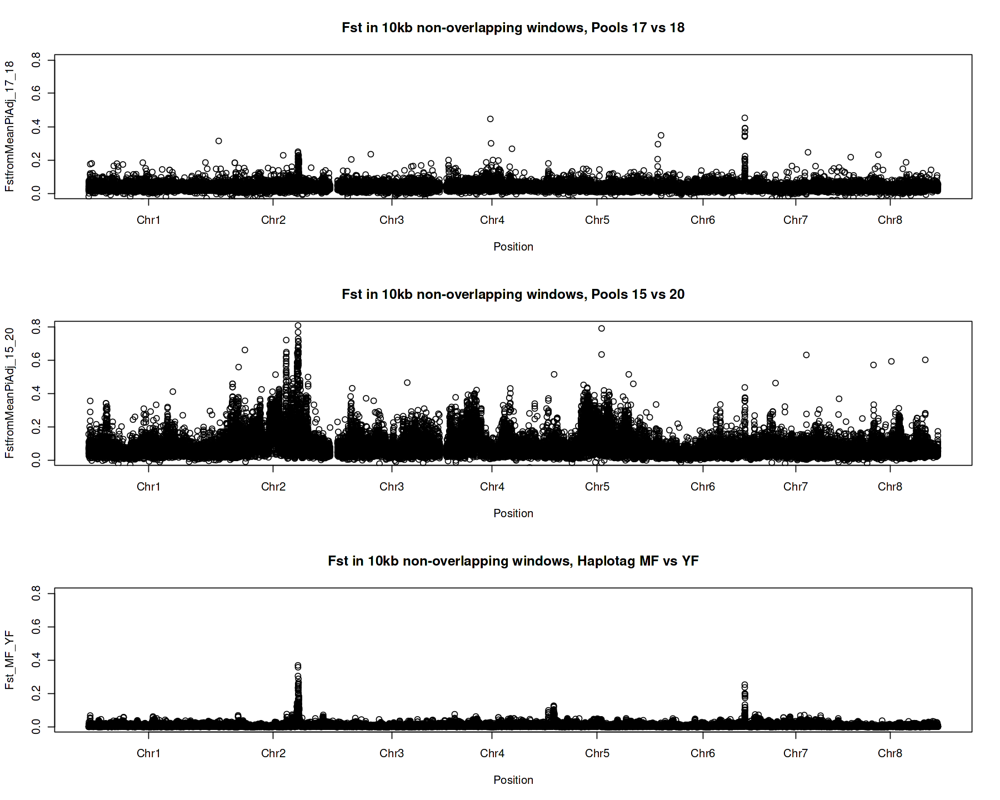

In [234]:
options(repr.plot.width=15, repr.plot.height=12)

par(mfrow=c(3,1), cex = 1)
plot(FstfromMeanPiAdj_17_18~midCum, stats_merged, ylim=c(0,0.8),
     main='Fst in 10kb non-overlapping windows, Pools 17 vs 18', xlab='Position', xaxt='n')
axis(side = 1, at = axisdf$chromCenter, label = axisdf$scaffold)

plot(FstfromMeanPiAdj_15_20~midCum, stats_merged, ylim=c(0,0.8), 
     main='Fst in 10kb non-overlapping windows, Pools 15 vs 20', xlab='Position', xaxt='n')
axis(side = 1, at = axisdf$chromCenter, label = axisdf$scaffold)
# plot(FstfromMeanPiAdj_15_20~midCum, stats_merged, ylim=c(0,0.7))
# plot(FstfromMeanPiAdj_15_20~midCum, stats_merged, ylim=c(0,0.7))
# plot(FstfromMeanPiAdj_15_20~midCum, stats_merged, ylim=c(0,0.7))
# plot(FstfromMeanPiAdj_17_18~windowEnd, stats_merged, ylim=c(0,0.5))
# plot(FstfromMeanPiAdj_10_20~windowEnd, stats_merged, ylim=c(0,0.5))
plot(Fst_MF_YF~midCum, stats_merged, ylim=c(0,0.8), 
     main='Fst in 10kb non-overlapping windows, Haplotag MF vs YF', xlab='Position', xaxt='n')
axis(side = 1, at = axisdf$chromCenter, label = axisdf$scaffold)

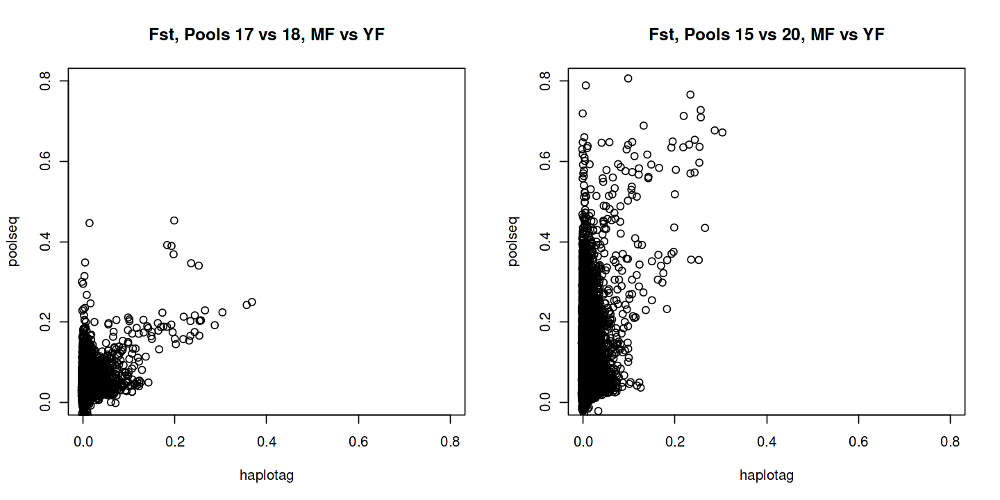

In [235]:
options(repr.plot.width=12, repr.plot.height=6)
par(mfrow=c(1,2))
plot(FstfromMeanPiAdj_17_18~Fst_MF_YF, stats_merged, xlim=c(0,0.8), ylim=c(0,0.8),
    xlab='haplotag', ylab='poolseq', main='Fst, Pools 17 vs 18, MF vs YF')
plot(FstfromMeanPiAdj_15_20~Fst_MF_YF, stats_merged, xlim=c(0,0.8), ylim=c(0,0.8),
    xlab='haplotag', ylab='poolseq', main='Fst, Pools 15 vs 20, MF vs YF')

## Checking Parvathy's KASP markers

In [70]:
## CREMOSA Chr1:500000-1500000

# Chr1	955183	955184	s1187_290152
chrom = 'Chr1'
pos = 955185
cbind(fst[CHROM == chrom & POS == pos], 
      piM[CHROM == chrom & POS == pos][,'PI'], 
      piY[CHROM == chrom & POS == pos][,'PI'],
      MAF[scaffold == chrom & position == pos][,-c(1:2)])

# print(MAF[scaffold == 'Chr1' & position >= pos & position <= 955190])

CHROM,POS,WEIR_AND_COCKERHAM_FST,PI,PI,MF,YF,total,posCum,dp,col
<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<dbl>,<chr>
Chr1,955185,0.295624,0.49047,0.290106,0.58,0.1747,0,955185,0.4053,red


In [69]:
## FLAVIA Chr2:52000000-54500000

# Chr2	53594772	53594773	s316_93292
chrom = 'Chr2'
pos = 53594773
cbind(fst[CHROM == chrom & POS == pos], 
      piM[CHROM == chrom & POS == pos][,'PI'], 
      piY[CHROM == chrom & POS == pos][,'PI'],
      MAF[scaffold == chrom & position == pos][,-c(1:2)])

# print(MAF[scaffold == 'Chr2' & position >= 53594770 & position <= 53594780])

CHROM,POS,WEIR_AND_COCKERHAM_FST,PI,PI,MF,YF,total,posCum,dp,col
<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<dbl>,<chr>
Chr2,53594773,0.583813,0.447427,0.103176,0.6667,0.0542,71913142,125507915,0.6125,red


In [68]:
## SULF Chr4:37500000-39000000

# Chr4	38316529	38316530	s91_39699
# Chr4	38397178    38397179	s91_122561 # being used
chrom = 'Chr4'
pos = c(38316523, 38316534, 38316536, 38397179)
cbind(fst[CHROM == chrom & POS %in% pos], 
      piM[CHROM == chrom & POS %in% pos][,'PI'], 
      piY[CHROM == chrom & POS %in% pos][,'PI'],
      MAF[scaffold == chrom & position %in% pos][,-c(1:2)])

# s91_39699
# MAF[scaffold == 'Chr4' & position >= 38316520 & position <= 38316540]
# # s91_122561
# MAF[scaffold == 'Chr4' & position == 38397179 ] #SULF

CHROM,POS,WEIR_AND_COCKERHAM_FST,PI,PI,MF,YF,total,posCum,dp,col
<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<dbl>,<chr>
Chr4,38316523,0.065993400,0.0648770,0.248850,0.0333,0.1446,214241204,252557727,0.1113,grey80
Chr4,38316534,0.000680948,0.0133333,0.000000,0.0067,0.0000,214241204,252557738,0.0067,grey80
Chr4,38316536,-0.001502540,0.1135570,0.155385,0.0600,0.0843,214241204,252557740,0.0243,grey80
Chr4,38397179,0.165343000,0.4117230,0.486601,0.2867,0.5904,214241204,252638383,0.3037,grey80


In [66]:
## RUBIA Chr5:6000000-7000000

# Chr5	6286921	6286922	s261_720757
chrom = 'Chr5'
pos = c(6286923)
cbind(fst[CHROM == chrom & POS %in% pos], 
      piM[CHROM == chrom & POS %in% pos][,'PI'], 
      piY[CHROM == chrom & POS %in% pos][,'PI'],
      MAF[scaffold == chrom & position %in% pos][,-c(1:2)])

# MAF[scaffold == 'Chr5' & position >= 6286910 & position <= 6286930]

CHROM,POS,WEIR_AND_COCKERHAM_FST,PI,PI,MF,YF,total,posCum,dp,col
<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<dbl>,<chr>
Chr5,6286923,0.129972,0.288501,0.49069,0.1733,0.4217,269124669,275411592,0.2484,grey80


In [67]:
## RosEL Chr6:52500000-53500000

chrom = 'Chr6'
pos = c(52889078,52889080,53061080)
cbind(fst[CHROM == chrom & POS %in% pos], 
      piM[CHROM == chrom & POS %in% pos][,'PI'], 
      piY[CHROM == chrom & POS %in% pos][,'PI'],
      MAF[scaffold == chrom & position %in% pos][,-c(1:2)])

# # ROS
# # ros_assembly_543443
# MAF[scaffold == 'Chr6' & position >= 52889070 & position <= 52889080]

# # EL
# # ros_assembly_715001	201	Chr6.   53061080	A	G	0.494	0.506	0.494
# MAF[scaffold == 'Chr6' & position == 53061080 ]

CHROM,POS,WEIR_AND_COCKERHAM_FST,PI,PI,MF,YF,total,posCum,dp,col
<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<dbl>,<chr>
Chr6,52889078,0.737862,0.0773154,0.320482,0.0400,0.8012,340106628,392995706,0.7612,red
Chr6,52889080,0.737862,0.0773154,0.320482,0.0400,0.8012,340106628,392995708,0.7612,red
Chr6,53061080,0.633755,0.3056820,0.231325,0.8133,0.1325,340106628,393167708,0.6808,red


## misc1

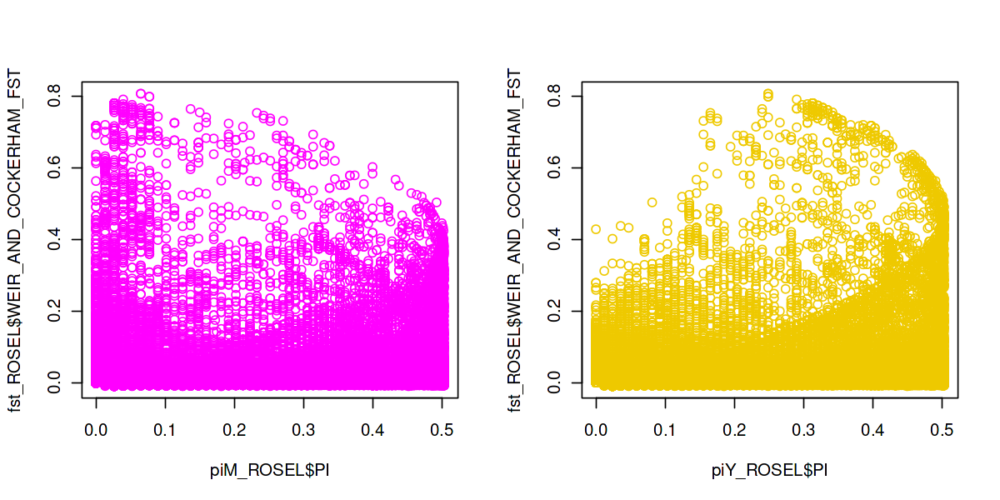

In [54]:
options(repr.plot.width=10, repr.plot.height=5)
par(mfrow=c(1,2))
plot(piM_ROSEL$PI, fst_ROSEL$WEIR_AND_COCKERHAM_FST, col='magenta')
plot(piY_ROSEL$PI, fst_ROSEL$WEIR_AND_COCKERHAM_FST, col='gold2')

## misc2

In [6]:
Chr6_AvePla = fread('./popgenStats/AvePla_Chr6_w10000.csv.gz', header=T)
Chr6_MY = fread('./popgenStats/Chr6_w10000.csv.gz', header=T)

In [7]:
str(Chr6_MY)

Classes ‘data.table’ and 'data.frame':	5570 obs. of  9 variables:
 $ scaffold : chr  "Chr6" "Chr6" "Chr6" "Chr6" ...
 $ start    : int  1 10001 20001 30001 40001 50001 60001 70001 80001 90001 ...
 $ end      : int  10000 20000 30000 40000 50000 60000 70000 80000 90000 100000 ...
 $ mid      : num  NaN 16714 21197 36356 42683 ...
 $ sites    : int  0 175 105 749 43 0 0 5 82 70 ...
 $ pi_MF    : num  NaN 0.1122 0.1152 0.1596 0.0747 ...
 $ pi_YF    : num  NaN 0.1121 0.1111 0.1495 0.0582 ...
 $ dxy_MF_YF: num  NaN 0.1125 0.1134 0.1544 0.0668 ...
 $ Fst_MF_YF: num  NaN 0.0014 0.0011 -0.0005 0.0028 NaN NaN -0.0024 -0.0001 0.001 ...
 - attr(*, ".internal.selfref")=<externalptr> 


In [9]:
str(Chr6_AvePla)

Classes ‘data.table’ and 'data.frame':	5570 obs. of  9 variables:
 $ scaffold   : chr  "Chr6" "Chr6" "Chr6" "Chr6" ...
 $ start      : int  1 10001 20001 30001 40001 50001 60001 70001 80001 90001 ...
 $ end        : int  10000 20000 30000 40000 50000 60000 70000 80000 90000 100000 ...
 $ mid        : num  NaN 16714 21197 36356 42683 ...
 $ sites      : int  0 175 105 749 43 0 0 5 82 70 ...
 $ pi_Ave     : num  NaN 0.102 0.099 0.123 0.106 ...
 $ pi_Pla     : num  NaN 0.0971 0.0775 0.1308 0.0582 ...
 $ dxy_Ave_Pla: num  NaN 0.1018 0.0925 0.131 0.0964 ...
 $ Fst_Ave_Pla: num  NaN 0.0118 0.0239 0.0155 0.0821 NaN NaN 0.0072 0.0452 0.0863 ...
 - attr(*, ".internal.selfref")=<externalptr> 


In [3]:
Chr1_MY = fread('./popgenStats/MY_Chr1_w10000.csv.gz', header=T)
Chr2_MY = fread('./popgenStats/MY_Chr2_w10000.csv.gz', header=T)
Chr3_MY = fread('./popgenStats/MY_Chr3_w10000.csv.gz', header=T)
Chr4_MY = fread('./popgenStats/MY_Chr4_w10000.csv.gz', header=T)
Chr5_MY = fread('./popgenStats/MY_Chr5_w10000.csv.gz', header=T)
Chr6_MY = fread('./popgenStats/MY_Chr6_w10000.csv.gz', header=T)
Chr7_MY = fread('./popgenStats/MY_Chr7_w10000.csv.gz', header=T)
Chr8_MY = fread('./popgenStats/MY_Chr8_w10000.csv.gz', header=T)

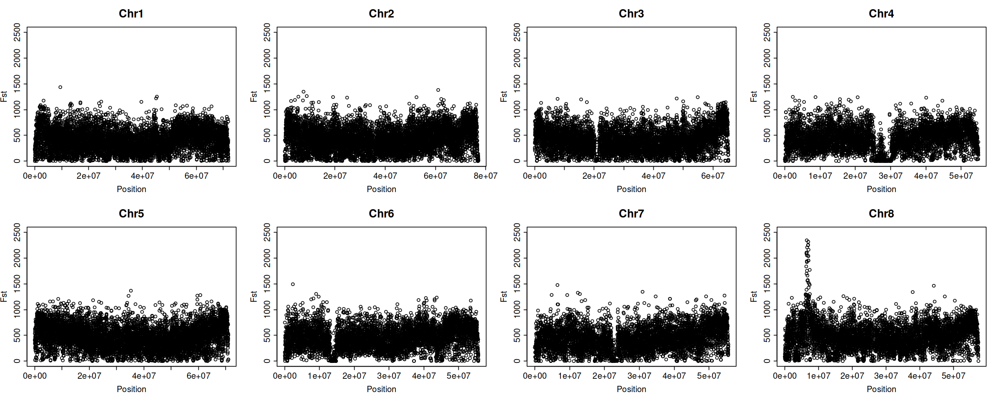

In [6]:
options(repr.plot.width=20, repr.plot.height=8)
xLabel='Position'
yLabel='Fst'
# xLimit=
yLimit=c(0,2500)

par(mfrow=c(2,4), cex.lab = 1.5, cex.axis = 1.5, cex.main = 2)

plot(Chr1_MY$mid, Chr1_MY$sites, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr1')
plot(Chr2_MY$mid, Chr2_MY$sites, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr2')
plot(Chr3_MY$mid, Chr3_MY$sites, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr3')
plot(Chr4_MY$mid, Chr4_MY$sites, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr4')
plot(Chr5_MY$mid, Chr5_MY$sites, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr5')
plot(Chr6_MY$mid, Chr6_MY$sites, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr6')
plot(Chr7_MY$mid, Chr7_MY$sites, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr7')
plot(Chr8_MY$mid, Chr8_MY$sites, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr8')

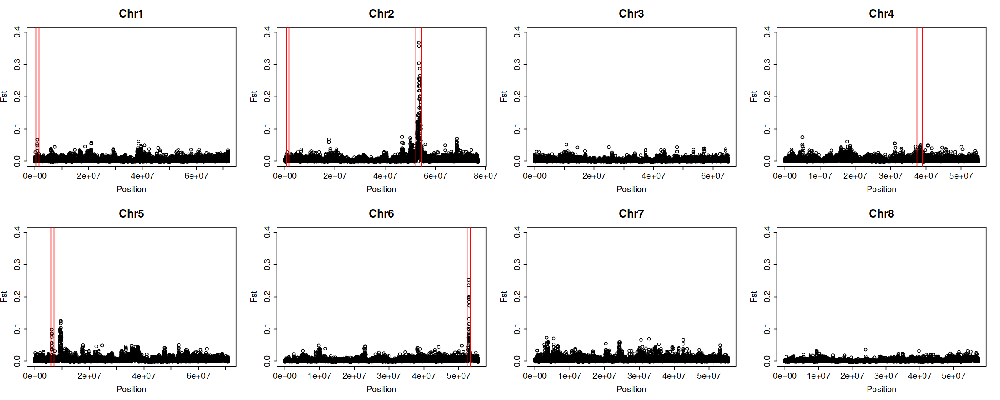

In [14]:
options(repr.plot.width=20, repr.plot.height=8)
xLabel='Position'
yLabel='Fst'
# xLimit=
yLimit=c(0,0.4)

par(mfrow=c(2,4), cex.lab = 1.5, cex.axis = 1.5, cex.main = 2)

plot(Chr1_MY$mid, Chr1_MY$Fst_MF_YF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr1')
abline(v=c(500000,1500000), col='red')
plot(Chr2_MY$mid, Chr2_MY$Fst_MF_YF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr2')
abline(v=c(600000,1600000), col='red')
abline(v=c(52000000,54500000), col='red')
plot(Chr3_MY$mid, Chr3_MY$Fst_MF_YF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr3')

plot(Chr4_MY$mid, Chr4_MY$Fst_MF_YF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr4')
abline(v=c(37500000,39000000), col='red')

plot(Chr5_MY$mid, Chr5_MY$Fst_MF_YF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr5')
abline(v=c(6000000,7000000), col='red')

plot(Chr6_MY$mid, Chr6_MY$Fst_MF_YF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr6')
abline(v=c(52500000,53500000), col='red')

plot(Chr7_MY$mid, Chr7_MY$Fst_MF_YF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr7')
plot(Chr8_MY$mid, Chr8_MY$Fst_MF_YF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr8')

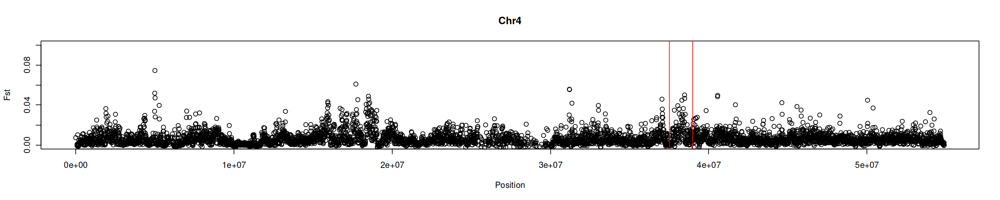

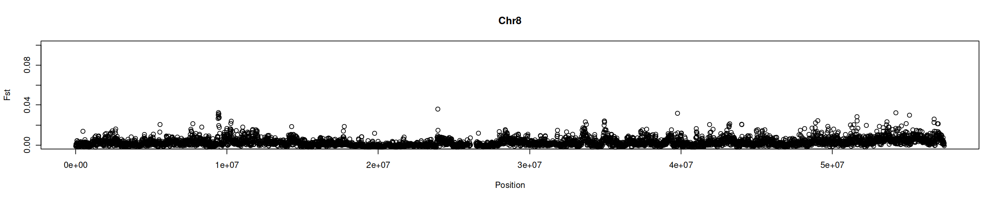

In [12]:
options(repr.plot.width=20, repr.plot.height=4)
xLabel='Position'
yLabel='Fst'
# xLimit=
yLimit=c(0,0.1)

# par(mfrow=c(1,1), cex.lab = 1.5, cex.axis = 1.5, cex.main = 2)

plot(Chr4_MY$mid, Chr4_MY$Fst_MF_YF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr4')
abline(v=c(37500000,39000000), col='red')
plot(Chr8_MY$mid, Chr8_MY$Fst_MF_YF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr8')

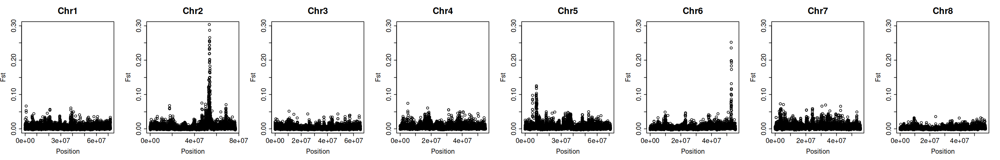

In [31]:
options(repr.plot.width=25, repr.plot.height=4)
xLabel='Position'
yLabel='Fst'
# xLimit=
yLimit=c(0,0.3)

par(mfrow=c(1,8), cex.lab = 1.5, cex.axis = 1.5, cex.main = 2)

plot(Chr1_MY$mid, Chr1_MY$Fst_MF_YF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr1')
# abline(v=c(500000,1500000), col='red')

plot(Chr2_MY$mid, Chr2_MY$Fst_MF_YF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr2')
# abline(v=c(600000,1600000), col='red')
# abline(v=c(52000000,54500000), col='red')

plot(Chr3_MY$mid, Chr3_MY$Fst_MF_YF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr3')

plot(Chr4_MY$mid, Chr4_MY$Fst_MF_YF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr4')
# abline(v=c(37500000,39000000), col='red')

plot(Chr5_MY$mid, Chr5_MY$Fst_MF_YF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr5')
# abline(v=c(6000000,7000000), col='red')

plot(Chr6_MY$mid, Chr6_MY$Fst_MF_YF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr6')
# abline(v=c(52500000,53500000), col='red')

plot(Chr7_MY$mid, Chr7_MY$Fst_MF_YF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr7')
plot(Chr8_MY$mid, Chr8_MY$Fst_MF_YF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr8')

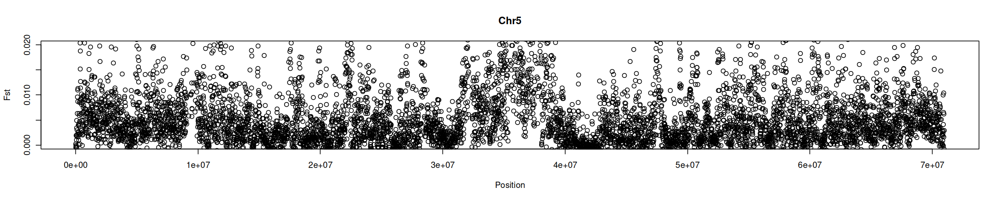

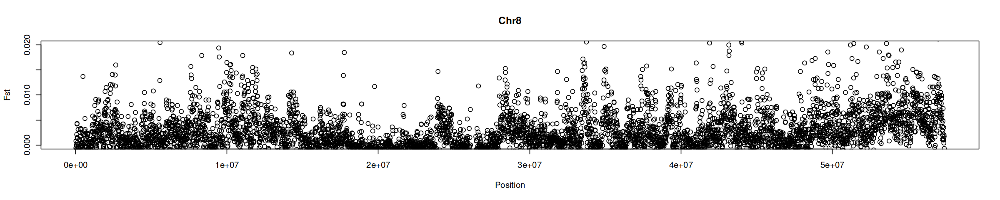

In [53]:
options(repr.plot.width=20, repr.plot.height=4)
xLabel='Position'
yLabel='Fst'
# xLimit=
yLimit=c(0,0.02)

# par(mfrow=c(1,1), cex.lab = 1.5, cex.axis = 1.5, cex.main = 2)

plot(Chr5_MY$mid, Chr5_MY$Fst_MF_YF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr5')
plot(Chr8_MY$mid, Chr8_MY$Fst_MF_YF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr8')

In [70]:
options(repr.plot.width=15, repr.plot.height=8)
nBreaks=30
xLimit=c(0,0.25)

violin(Chr1_MY$Fst_MF_YF)

# par(mfrow=c(2,4))
# hist(Chr1_MY$Fst_MF_YF, breaks=nBreaks, xlim=xLimit)
# hist(Chr3_MY$Fst_MF_YF, breaks=nBreaks, xlim=xLimit)
# hist(Chr4_MY$Fst_MF_YF, breaks=nBreaks, xlim=xLimit)
# hist(Chr5_MY$Fst_MF_YF, breaks=nBreaks, xlim=xLimit)
# hist(Chr6_MY$Fst_MF_YF, breaks=nBreaks, xlim=xLimit)
# hist(Chr7_MY$Fst_MF_YF, breaks=nBreaks, xlim=xLimit)
# hist(Chr8_MY$Fst_MF_YF, breaks=nBreaks, xlim=xLimit)

ERROR: Error in violin(Chr1_MY$Fst_MF_YF): could not find function "violin"


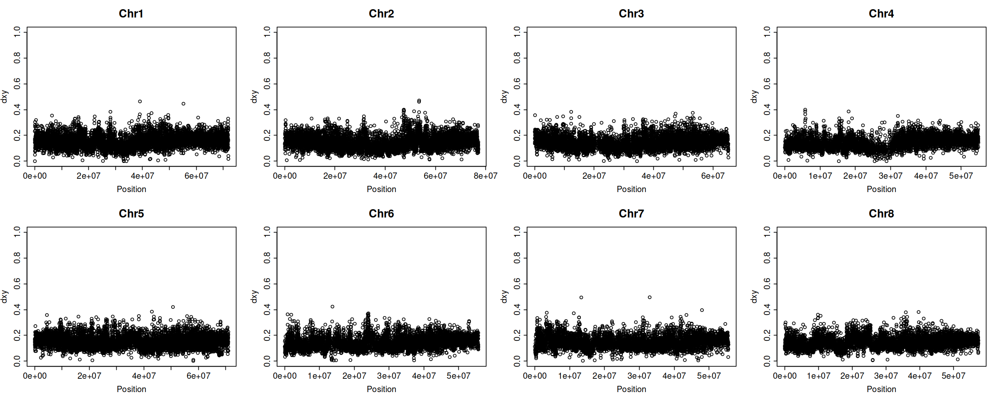

In [10]:
options(repr.plot.width=20, repr.plot.height=8)
xLabel='Position'
yLabel='dxy'
# xLimit=
yLimit=c(0,1)

par(mfrow=c(2,4), cex.lab = 1.5, cex.axis = 1.5, cex.main = 2)

plot(Chr1_MY$mid, Chr1_MY$dxy_MF_YF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr1')
plot(Chr2_MY$mid, Chr2_MY$dxy_MF_YF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr2')
plot(Chr3_MY$mid, Chr3_MY$dxy_MF_YF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr3')
plot(Chr4_MY$mid, Chr4_MY$dxy_MF_YF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr4')
plot(Chr5_MY$mid, Chr5_MY$dxy_MF_YF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr5')
plot(Chr6_MY$mid, Chr6_MY$dxy_MF_YF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr6')
plot(Chr7_MY$mid, Chr7_MY$dxy_MF_YF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr7')
plot(Chr8_MY$mid, Chr8_MY$dxy_MF_YF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr8')

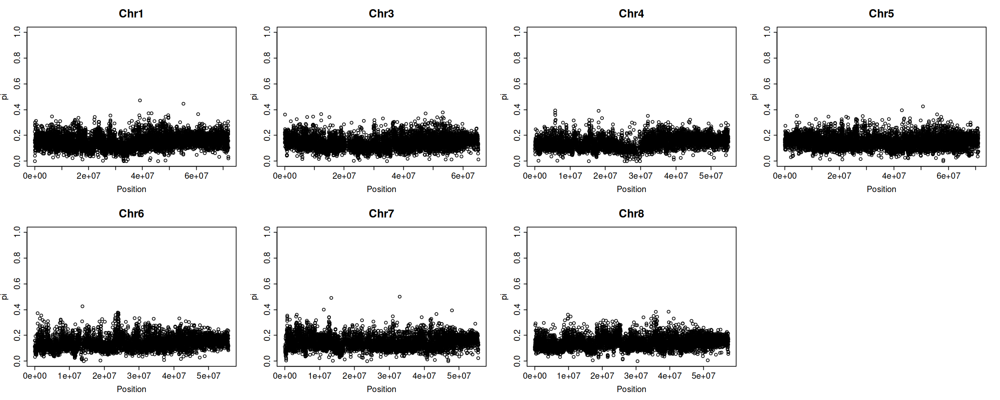

In [45]:
options(repr.plot.width=20, repr.plot.height=8)
xLabel='Position'
yLabel='pi'
# xLimit=
yLimit=c(0,1)

par(mfrow=c(2,4), cex.lab = 1.5, cex.axis = 1.5, cex.main = 2)

plot(Chr1_MY$mid, Chr1_MY$pi_MF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr1')
plot(Chr3_MY$mid, Chr3_MY$pi_MF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr3')
plot(Chr4_MY$mid, Chr4_MY$pi_MF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr4')
plot(Chr5_MY$mid, Chr5_MY$pi_MF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr5')
plot(Chr6_MY$mid, Chr6_MY$pi_MF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr6')
plot(Chr7_MY$mid, Chr7_MY$pi_MF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr7')
plot(Chr8_MY$mid, Chr8_MY$pi_MF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr8')

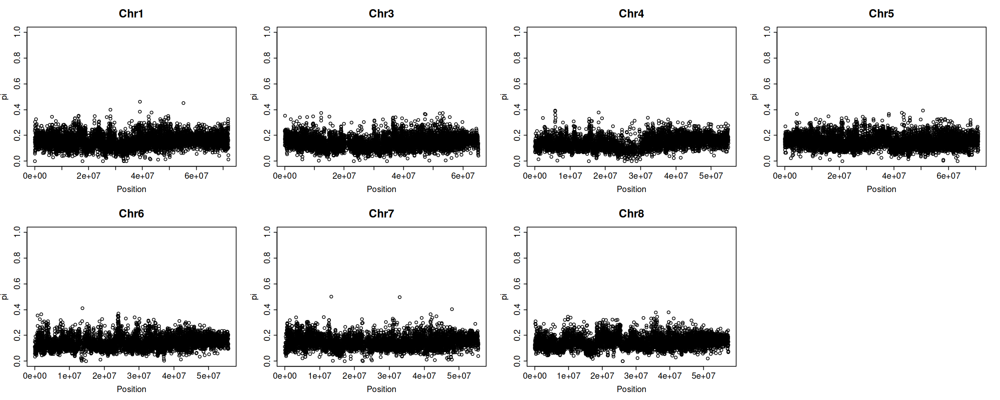

In [46]:
options(repr.plot.width=20, repr.plot.height=8)
xLabel='Position'
yLabel='pi'
# xLimit=
yLimit=c(0,1)

par(mfrow=c(2,4), cex.lab = 1.5, cex.axis = 1.5, cex.main = 2)

plot(Chr1_MY$mid, Chr1_MY$pi_YF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr1')
plot(Chr3_MY$mid, Chr3_MY$pi_YF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr3')
plot(Chr4_MY$mid, Chr4_MY$pi_YF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr4')
plot(Chr5_MY$mid, Chr5_MY$pi_YF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr5')
plot(Chr6_MY$mid, Chr6_MY$pi_YF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr6')
plot(Chr7_MY$mid, Chr7_MY$pi_YF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr7')
plot(Chr8_MY$mid, Chr8_MY$pi_YF, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr8')

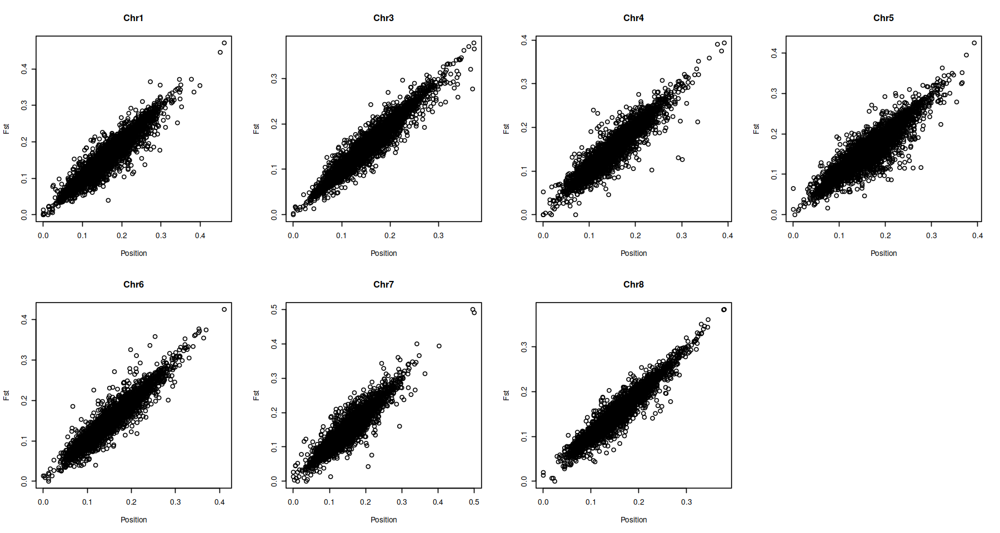

In [79]:
par(mfrow=c(2, 4))
plot(pi_MF~pi_YF, Chr1_MY, xlab=xLabel, ylab=yLabel, main='Chr1')
# plot(pi_MF~pi_YF, Chr2_MY, xlab=xLabel, ylab=yLabel, main='Chr2')
plot(pi_MF~pi_YF, Chr3_MY, xlab=xLabel, ylab=yLabel, main='Chr3')
plot(pi_MF~pi_YF, Chr4_MY, xlab=xLabel, ylab=yLabel, main='Chr4')
plot(pi_MF~pi_YF, Chr5_MY, xlab=xLabel, ylab=yLabel, main='Chr5')
plot(pi_MF~pi_YF, Chr6_MY, xlab=xLabel, ylab=yLabel, main='Chr6')
plot(pi_MF~pi_YF, Chr7_MY, xlab=xLabel, ylab=yLabel, main='Chr7')
plot(pi_MF~pi_YF, Chr8_MY, xlab=xLabel, ylab=yLabel, main='Chr8')

In [83]:
## Ave vs Pla

In [85]:
Chr1_AvePla = fread('./popgenStats/AvePla_Chr1_w10000.csv.gz', header=T)
# Chr2_AvePla = fread('./popgenStats/AvePla_Chr2_w10000.csv.gz', header=T)
Chr3_AvePla = fread('./popgenStats/AvePla_Chr3_w10000.csv.gz', header=T)
Chr4_AvePla = fread('./popgenStats/AvePla_Chr4_w10000.csv.gz', header=T)
Chr5_AvePla = fread('./popgenStats/AvePla_Chr5_w10000.csv.gz', header=T)
Chr6_AvePla = fread('./popgenStats/AvePla_Chr6_w10000.csv.gz', header=T)
Chr7_AvePla = fread('./popgenStats/AvePla_Chr7_w10000.csv.gz', header=T)
Chr8_AvePla = fread('./popgenStats/AvePla_Chr8_w10000.csv.gz', header=T)

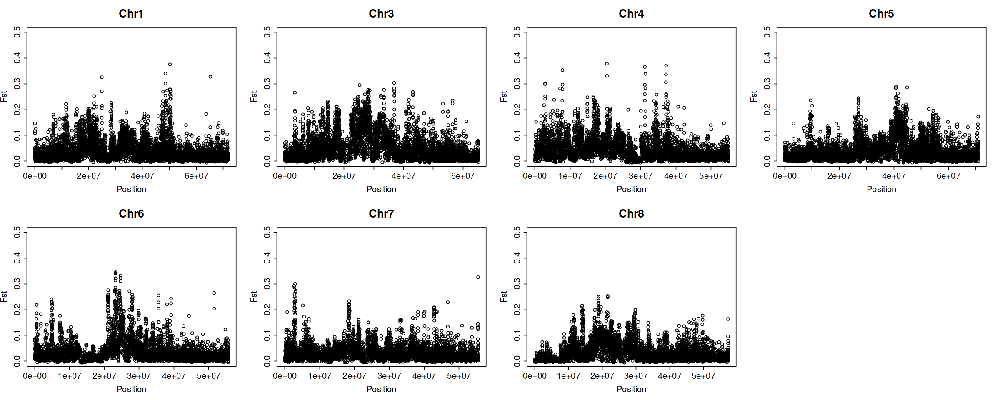

In [87]:
options(repr.plot.width=20, repr.plot.height=8)
xLabel='Position'
yLabel='Fst'
# xLimit=
yLimit=c(0,0.5)

par(mfrow=c(2,4), cex.lab = 1.5, cex.axis = 1.5, cex.main = 2)
plot(Fst_Ave_Pla~mid, Chr1_AvePla, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr1')
# plot(Fst_Ave_Pla~mid, Chr2_AvePla, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr2')
plot(Fst_Ave_Pla~mid, Chr3_AvePla, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr3')
plot(Fst_Ave_Pla~mid, Chr4_AvePla, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr4')
plot(Fst_Ave_Pla~mid, Chr5_AvePla, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr5')
plot(Fst_Ave_Pla~mid, Chr6_AvePla, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr6')
plot(Fst_Ave_Pla~mid, Chr7_AvePla, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr7')
plot(Fst_Ave_Pla~mid, Chr8_AvePla, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr8')

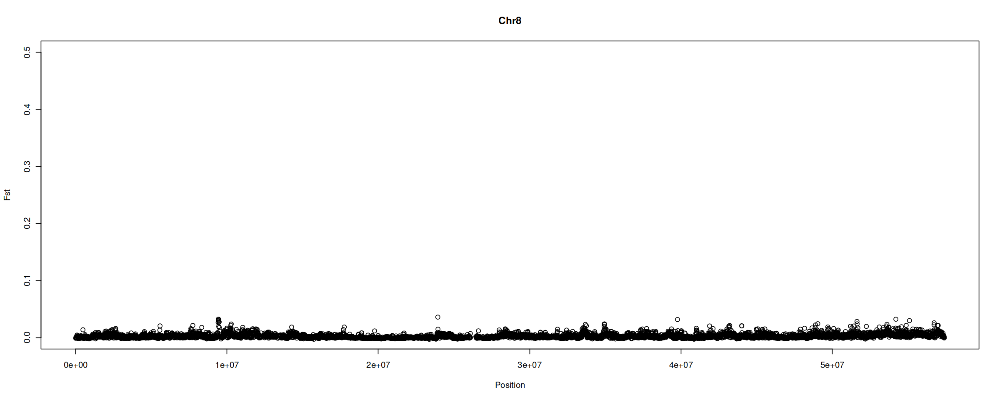

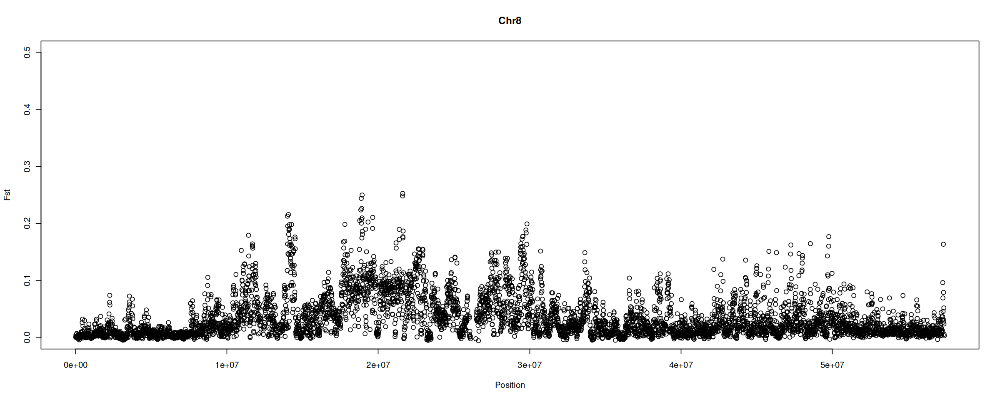

In [90]:
# options(repr.plot.wi)
par(mfrow=c(1,1))
plot(Fst_MF_YF~mid, Chr8_MY, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr8')
plot(Fst_Ave_Pla~mid, Chr8_AvePla, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr8')

In [ ]:
par(mfrow=c(1,1))
plot(Fst_MF_YF~mid, Chr8_MY, xlab=xLabel, ylab=yLabel, ylim=yLimit, main='Chr8')

In [47]:
## Read allele frequencies
baseDIR='~/snap_hap/genome_scans'
maf = foreach (chrom in c(1:8), .combine = rbind) %do% {
    filename=file.path(baseDIR, "alleleFreq", paste0("MY_Chr",chrom.".MAF.csv.gz"))
    tmp = fread(filename, header=TRUE)
    tmp
}

ERROR: Error in parse(text = x, srcfile = src): <text>:3:22: unexpected 'in'
2: baseDIR='~/snap_hap/genome_scans'
3: maf = foreach (chrom in
                        ^


In [48]:
maf = maf %>% rowwise() %>% mutate(dp = MF-YF)

In [49]:
maf = as.data.table(maf)
str(maf)

Classes ‘data.table’ and 'data.frame':	19925574 obs. of  6 variables:
 $ scaffold   : chr  "Chr1" "Chr1" "Chr1" "Chr1" ...
 $ position   : int  3817 3850 3873 3881 3917 3922 3946 3981 3992 3994 ...
 $ MF         : num  0.2667 0.18 0 0.0067 0.4 ...
 $ YF         : num  0.256 0.259 0.012 0 0.416 ...
 $ dp         : num  0.0106 -0.079 -0.012 0.0067 -0.0157 ...
 $ chromNumber: num  1 1 1 1 1 1 1 1 1 1 ...
 - attr(*, "groups")= tibble [19,925,574 × 1] (S3: tbl_df/tbl/data.frame)
  ..$ .rows: list<int> [1:19925574] 
  .. ..$ : int 1
  .. ..$ : int 2
  .. ..$ : int 3
  .. ..$ : int 4
  .. ..$ : int 5
  .. ..$ : int 6
  .. ..$ : int 7
  .. ..$ : int 8
  .. ..$ : int 9
  .. ..$ : int 10
  .. ..$ : int 11
  .. ..$ : int 12
  .. ..$ : int 13
  .. ..$ : int 14
  .. ..$ : int 15
  .. ..$ : int 16
  .. ..$ : int 17
  .. ..$ : int 18
  .. ..$ : int 19
  .. ..$ : int 20
  .. ..$ : int 21
  .. ..$ : int 22
  .. ..$ : int 23
  .. ..$ : int 24
  .. ..$ : int 25
  .. ..$ : int 26
  .. ..$ : int 27
  .. ..

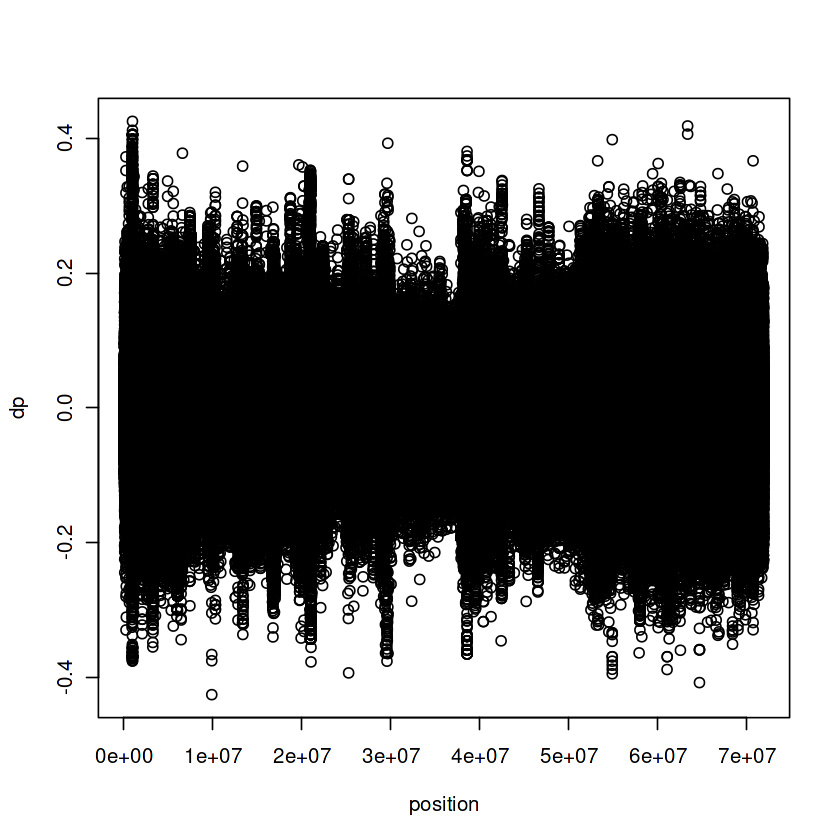

In [50]:
plot(dp~position, maf[scaffold=='Chr1'])